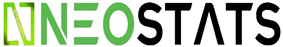



# Banking Business Case

**Submitted by: Harsha KG**

# ***Problem Statement:***

 A major bank in Middle East came to NeoStats with help in analysing its current customer base and its marketing campaigns. It wants to understand which customers are most likely to take a term deposit (fixed deposit), and then send this list to their call centre.

The data has been provided in attached excel sheet. You as NeoStats employee are tasked with carrying out this project. Please carry out the analysis and answer the questions given below. 
Make suitable assumptions, define the steps clearly and document your code when required. 


# ***Guidelines for Submission:***


***1. Data Analysis Tool:***
•	Use python for all the analysis. Share the Jupyter notebook or Google Colab link for data pre-processing, analysis, visualization, and model training.

***2. Presentation:***
•	Prepare a crisp PowerPoint presentation summarizing your findings, approach, and results. Keep it within a 10-minute timeframe to maintain engagement.

***3. Question & Answer Session:***
•	After your presentation, be prepared for a 5-minute Q&A round. Ensure you understand every aspect of your analysis and approach, as the panel might ask in-depth or technical questions.


# ***Analysis Questions:***


***•	Data Analysis & Visualization:***

***1. Income Insights:***
•	How many customers have no annual income? Plot and present the data distribution of these customers.

***2. Loan-less Customers Profile:***
•	Filter out customers who don’t have any type of loan. Plot the distribution of their Income, balance, and profession. How do these metrics differ from those with loans?

***3. Loan and Insurance Analysis:***
•	Calculate the percentage of customers with a loan who have taken out insurance. Visualize this data and discuss potential implications.

***4. Communication Strategy Insights:***
•	Analyse and summarize the best Contact method (with the highest success percentage) to contact people to ascertain the status of term deposit subscriptions.

***5. Age and Home Loans:***
•	Determine which age group has the highest percentage of home loans. Present this data visually and discuss possible reasons.

***6. Income and Age Relationship:***
•	Investigate any relationships between annual income and age group. Use appropriate plots and statistics to present the findings.


***Modeling:***

***1. Term Deposit and Related Variables:***

•	Identify variables strongly related to Term Deposit. Discuss your approach when the variable is categorical. Which tests or metrics will you employ?

***2. Predictive Model Building:***

•	Train a prediction model of your choice to estimate the probability that a customer will opt for a term deposit. Adhere to an 80:20 train:test split. Report and present the model's performance metrics on both the train and test datasets.

***3. Model Improvement Strategies:***

•	Discuss potential methods or approaches to enhance model performance. This could include feature engineering, different algorithms, or refining the data preprocessing steps.


# ***Evaluation Criteria:***


Candidates are expected to showcase their analytical, logical thinking, and deduction skills throughout this challenge. Your approach to the problem, as well as your ability to present and defend your findings, will be central to the evaluation process. 
Please ensure the work is your original work. Any kind of plagiarism or taking help from others will have adverse consequences.


# ***1. Import Packages***

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import shapiro
from scipy.stats import probplot
import statsmodels.api as sm
import scipy.stats as stats
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split



# ***2. Load the Data Files to Generate DataFrame***

In [2]:


# Specify the path to your Excel file
file_name = "C:/Users/hp/Desktop/Banking Case.xlsx"

In [3]:


# Specify the names of the worksheets you want to read from the workbook
sheet_names = ["Data Dictionary", "Transaction Data", "Customer Demographics"]

# Initialize an empty dictionary to store DataFrames
all_dataframes = {}

try:
    # Read each sheet into a separate DataFrame with dynamic names
    for i, sheet in enumerate(sheet_names, start=1):
        dataframe_name = f"df{i}"
        all_dataframes[dataframe_name] = pd.read_excel(file_name, sheet_name=sheet)

    # Now, 'df1', 'df2', 'df3', etc. are the DataFrames for each sheet
    for dataframe_name, df in all_dataframes.items():
        print(f"Data for {dataframe_name}:")
        print(df)
        print("\n" + "=" * 40 + "\n")

    #  Access df's outside the loop if needed
    df_data = all_dataframes['df1']
    df_trans_data = all_dataframes['df2']
    df_cust_data = all_dataframes['df3']

except FileNotFoundError:
    print(f"File not found: '{file_name}'. Please check the file name and try again.")

except pd.errors.EmptyDataError:
    print(f"The Excel file '{file_name}' is empty.")

except pd.errors.ParserError:
    print(f"Unable to parse the Excel file '{file_name}'. Please check the file format.")

except Exception as e:
    print(f"An error occurred: {e}")


Data for df1:
    Unnamed: 0         Unnamed: 1  \
0          NaN           Variable   
1          NaN    Customer_number   
2          NaN  Acc_creation_date   
3          NaN          Insurance   
4          NaN            balance   
5          NaN            housing   
6          NaN               loan   
7          NaN            contact   
8          NaN           duration   
9          NaN           campaign   
10         NaN   last_contact_day   
11         NaN           previous   
12         NaN           poutcome   
13         NaN       Term Deposit   
14         NaN          Count_Txn   
15         NaN                NaN   
16         NaN                NaN   
17         NaN    Customer_number   
18         NaN                age   
19         NaN                job   
20         NaN            marital   
21         NaN          education   
22         NaN      Annual Income   
23         NaN             Gender   

                                           Unnamed: 2       

In [4]:
#print data_dictionary worksheet content in a datafrane
df_data

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3
0,NaN,Variable,Description,Data Type
1,NaN,Customer_number,Unique Customer Identification number,ID
2,NaN,Acc_creation_date,Account opening date,Date
3,NaN,Insurance,Has the customer taken insurance?,Categorical
4,NaN,balance,NaN,Numeric
5,NaN,housing,Has the customer taken housing loan?,Categorical
6,NaN,loan,Has the customer taken personal loan?,Categorical
7,NaN,contact,Contact communication type,Categorical
8,NaN,duration,Duration of call with the customer for Term loan,Numeric
9,NaN,campaign,Number of contacts performed during this campa...,Numeric


In [5]:
#print the transaction_data worksheet in a dataframe
df_trans_data

,Sno,Customer_number,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn
0,0,1001,no,2143,yes,no,NaN,261.0,1,2,0,unknown,no,351.0
1,1,1002,no,29,yes,no,unknown,151.0,1,2,0,unknown,no,326.0
2,2,1003,no,2,yes,yes,unknown,76.0,1,2,0,NaN,no,422.0
3,3,1004,no,1506,yes,no,unknown,92.0,1,2,0,unknown,no,113.0
4,4,1005,no,1,no,no,unknown,198.0,1,2,0,unknown,no,342.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,45206,46207,no,825,no,no,cellular,0.0,0,-1,0,unknown,yes,152.0
45207,45207,46208,no,1729,no,no,cellular,0.0,0,-1,0,unknown,yes,334.0
45208,45208,46209,no,5715,no,no,cellular,1127.0,5,184,3,success,yes,381.0
45209,45209,46210,no,668,no,no,telephone,0.0,0,-1,0,unknown,no,211.0


In [6]:
#print the customer_demographics_data in a dataframe
df_cust_data

,Customer_number,age,job,marital,education,Annual Income,Gender
0,1001,58,management,married,tertiary,839368,M
1,1002,44,technician,single,secondary,1452858,M
2,1003,33,entrepreneur,married,NaN,4851383,F
3,1004,47,blue collar,married,unknown,3207754,F
4,1005,33,unknown,single,unknown,2562322,M
...,...,...,...,...,...,...,...
45206,46207,51,technician,married,tertiary,2229818,M
45207,46208,121,retired,divorced,primary,2783556,M
45208,46209,72,retired,married,secondary,443512,M
45209,46210,57,blue-collar,married,secondary,4193684,F


***Combine the dataframes transaction_data and Customer_Demographics dataframe***

In [7]:
#'Customer_number' is the common column
merged_df = pd.merge(df_trans_data, df_cust_data, on='Customer_number')

In [8]:
merged_df

,Sno,Customer_number,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn,age,job,marital,education,Annual Income,Gender
0,0,1001,no,2143,yes,no,NaN,261.0,1,2,0,unknown,no,351.0,58,management,married,tertiary,839368,M
1,1,1002,no,29,yes,no,unknown,151.0,1,2,0,unknown,no,326.0,44,technician,single,secondary,1452858,M
2,2,1003,no,2,yes,yes,unknown,76.0,1,2,0,NaN,no,422.0,33,entrepreneur,married,NaN,4851383,F
3,3,1004,no,1506,yes,no,unknown,92.0,1,2,0,unknown,no,113.0,47,blue collar,married,unknown,3207754,F
4,4,1005,no,1,no,no,unknown,198.0,1,2,0,unknown,no,342.0,33,unknown,single,unknown,2562322,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,45206,46207,no,825,no,no,cellular,0.0,0,-1,0,unknown,yes,152.0,51,technician,married,tertiary,2229818,M
45207,45207,46208,no,1729,no,no,cellular,0.0,0,-1,0,unknown,yes,334.0,121,retired,divorced,primary,2783556,M
45208,45208,46209,no,5715,no,no,cellular,1127.0,5,184,3,success,yes,381.0,72,retired,married,secondary,443512,M
45209,45209,46210,no,668,no,no,telephone,0.0,0,-1,0,unknown,no,211.0,57,blue-collar,married,secondary,4193684,F


# ***3. Data Cleaning***

***3.1 Header correction for data_dictionary dataframe***

In [9]:
# skip the first row, and use the second row as the header
df_data = pd.read_excel(file_name, header=1)

# Display the resulting DataFrame
df_data

,Unnamed: 0,Variable,Description,Data Type
0,NaN,Customer_number,Unique Customer Identification number,ID
1,NaN,Acc_creation_date,Account opening date,Date
2,NaN,Insurance,Has the customer taken insurance?,Categorical
3,NaN,balance,NaN,Numeric
4,NaN,housing,Has the customer taken housing loan?,Categorical
5,NaN,loan,Has the customer taken personal loan?,Categorical
6,NaN,contact,Contact communication type,Categorical
7,NaN,duration,Duration of call with the customer for Term loan,Numeric
8,NaN,campaign,Number of contacts performed during this campa...,Numeric
9,NaN,last_contact_day,Number of days that passed by after the client...,Numeric


***3.2 remove the column Unnamed: 0***

In [10]:
df_data=df_data.drop("Unnamed: 0",axis=1)

In [11]:
df_data

,Variable,Description,Data Type
0,Customer_number,Unique Customer Identification number,ID
1,Acc_creation_date,Account opening date,Date
2,Insurance,Has the customer taken insurance?,Categorical
3,balance,NaN,Numeric
4,housing,Has the customer taken housing loan?,Categorical
5,loan,Has the customer taken personal loan?,Categorical
6,contact,Contact communication type,Categorical
7,duration,Duration of call with the customer for Term loan,Numeric
8,campaign,Number of contacts performed during this campa...,Numeric
9,last_contact_day,Number of days that passed by after the client...,Numeric


**3.3 Understanding Attributes**

***checking the shape of the DataFrames***

In [12]:

# Create a dictionary to store DataFrames with corresponding names
bank_dataframes = {'df_data': df_data, 'df_trans_data': df_trans_data, 'df_cust_data': df_cust_data}

# Iterate through bank_DataFrames and print the shape
for df_name, df in bank_dataframes.items():
    print(f"Shape of {df_name}: {df.shape}")


Shape of df_data: (23, 3)
Shape of df_trans_data: (45211, 14)
Shape of df_cust_data: (45211, 7)


***3.4 Let's Get The Detail Data Info To Understand Each Independent Attribute, it's data type and its meaning***

In [13]:

# Create a dictionary to store DataFrames with corresponding names
bank_dataframes = {'df_data': df_data, 'df_trans_data': df_trans_data, 'df_cust_data': df_cust_data}

# Iterate through bank_DataFrames and print the shape
for df_name, df in bank_dataframes.items():
    print(f"Info of {df_name}: {df.info()}")


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23 entries, 0 to 22
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Variable     21 non-null     object
 1   Description  20 non-null     object
 2   Data Type    21 non-null     object
dtypes: object(3)
memory usage: 680.0+ bytes
Info of df_data: None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Sno               45211 non-null  int64  
 1   Customer_number   45211 non-null  int64  
 2   Insurance         45211 non-null  object 
 3   balance           45156 non-null  object 
 4   housing           45211 non-null  object 
 5   loan              45203 non-null  object 
 6   contact           45168 non-null  object 
 7   duration          45172 non-null  float64
 8   campaign          45211 non-null  int64  


***3.5 Summary of DataFrames***

***describe() statitics method here only serve numerical attribute and attibutes which are categorical in nature here is ignored.So we use include='object', provides categorical data information***

In [14]:
merged_df.describe()

,Sno,Customer_number,duration,campaign,last_contact_day,previous,Count_Txn,age
count,45211.000000,45211.000000,45172.000000,45211.000000,45211.000000,45211.000000,45210.000000,45211.000000
mean,22605.000000,23606.000000,258.139511,2.762182,41.832253,0.580323,299.614952,40.980005
std,13051.435847,13051.435847,257.631452,3.087291,99.457030,2.303441,115.721788,10.838273
min,0.000000,1001.000000,-167.000000,0.000000,-9.000000,0.000000,-423.000000,18.000000
25%,11302.500000,12303.500000,103.000000,1.000000,1.000000,0.000000,200.000000,33.000000
50%,22605.000000,23606.000000,180.000000,2.000000,1.000000,0.000000,300.000000,39.000000
75%,33907.500000,34908.500000,319.000000,3.000000,1.000000,0.000000,400.000000,48.000000
max,45210.000000,46211.000000,4918.000000,63.000000,871.000000,275.000000,499.000000,121.000000


In [15]:
merged_df.describe(include='object')

,Insurance,balance,housing,loan,contact,poutcome,Term Deposit,job,marital,education,Annual Income,Gender
count,45211,45156,45211,45203,45168,45196,45203,45198,45193,45190,45194,45211
unique,2,6268,2,2,6,7,2,13,3,6,44972,2
top,no,0,yes,no,cellular,unknown,no,blue-collar,married,secondary,1380371,M
freq,44396,3514,25130,37959,29282,36884,39914,9623,27202,23187,3,27168


In [16]:
import pandas as pd

# Assuming merged_df is your DataFrame
balance_dtype = merged_df['balance'].dtype

print("Data Type of 'balance' Column:", balance_dtype)


Data Type of 'balance' Column: object


In [17]:
import pandas as pd

# Assuming merged_df is your DataFrame
merged_df['Annual Income'] = pd.to_numeric(merged_df['Annual Income'], errors='coerce')
merged_df['balance'] = pd.to_numeric(merged_df['balance'], errors='coerce')

# 'coerce' parameter is used to handle non-numeric values by converting them to NaN

# Confirm the changes
print("Data Types after Conversion:")
print(merged_df.dtypes)


Data Types after Conversion:
Sno                   int64
Customer_number       int64
Insurance            object
balance             float64
housing              object
loan                 object
contact              object
duration            float64
campaign              int64
last_contact_day      int64
previous              int64
poutcome             object
Term Deposit         object
Count_Txn           float64
age                   int64
job                  object
marital              object
education            object
Annual Income       float64
Gender               object
dtype: object


In [18]:
merged_df.describe()

,Sno,Customer_number,balance,duration,campaign,last_contact_day,previous,Count_Txn,age,Annual Income
count,45211.000000,45211.000000,45130.000000,45172.000000,45211.000000,45211.000000,45211.000000,45210.000000,45211.000000,4.519300e+04
mean,22605.000000,23606.000000,1417.212741,258.139511,2.762182,41.832253,0.580323,299.614952,40.980005,2.596569e+06
std,13051.435847,13051.435847,3022.842910,257.631452,3.087291,99.457030,2.303441,115.721788,10.838273,1.393322e+06
min,0.000000,1001.000000,-280.000000,-167.000000,0.000000,-9.000000,0.000000,-423.000000,18.000000,2.006000e+05
25%,11302.500000,12303.500000,137.000000,103.000000,1.000000,1.000000,0.000000,200.000000,33.000000,1.386930e+06
50%,22605.000000,23606.000000,486.500000,180.000000,2.000000,1.000000,0.000000,300.000000,39.000000,2.586789e+06
75%,33907.500000,34908.500000,1440.000000,319.000000,3.000000,1.000000,0.000000,400.000000,48.000000,3.803066e+06
max,45210.000000,46211.000000,102127.000000,4918.000000,63.000000,871.000000,275.000000,499.000000,121.000000,9.458762e+06


In [19]:
merged_df.describe(include='object')

,Insurance,housing,loan,contact,poutcome,Term Deposit,job,marital,education,Gender
count,45211,45211,45203,45168,45196,45203,45198,45193,45190,45211
unique,2,2,2,6,7,2,13,3,6,2
top,no,yes,no,cellular,unknown,no,blue-collar,married,secondary,M
freq,44396,25130,37959,29282,36884,39914,9623,27202,23187,27168


***3.6 check for the null values in dataframe***

***3.7 Replace Missing Value with apropriate Statistical Values(Mean/Median/Mode Impuatation)***

In [20]:
# Check for null values in the entire DataFrame
null_values = merged_df.isnull().sum()

# Display the null values
print(null_values)

Sno                  0
Customer_number      0
Insurance            0
balance             81
housing              0
loan                 8
contact             43
duration            39
campaign             0
last_contact_day     0
previous             0
poutcome            15
Term Deposit         8
Count_Txn            1
age                  0
job                 13
marital             18
education           21
Annual Income       18
Gender               0
dtype: int64


**1. Income Insights:
•	How many customers have no annual income? Plot and present the data distribution of these customers.**


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\2716900329.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=no_income_customers['Annual Income'].isnull(), palette='viridis')


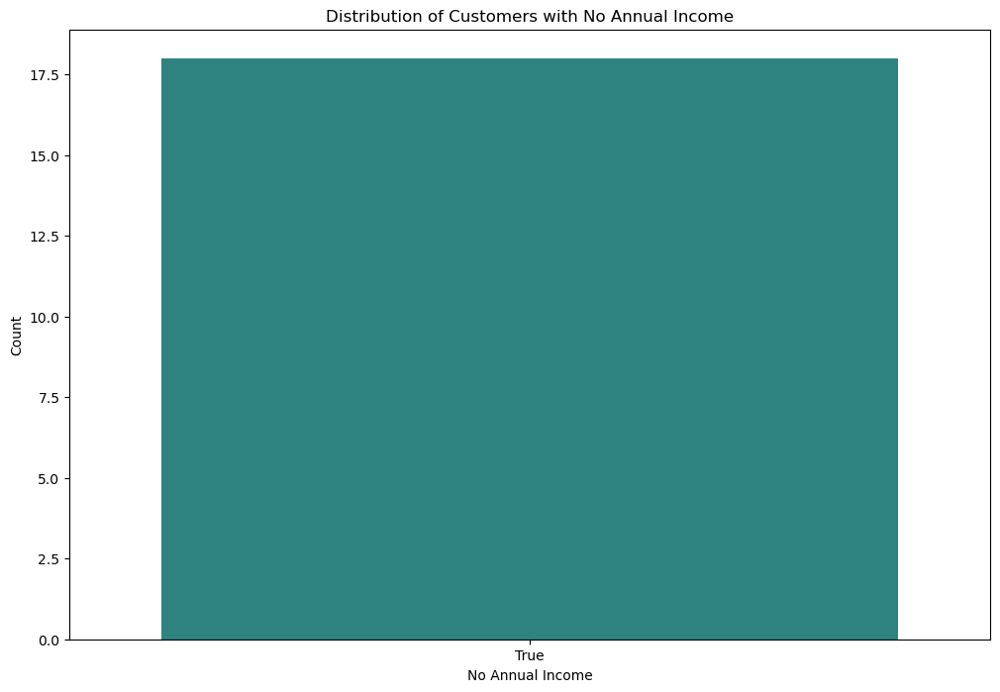

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Annual Income' is the column in your DataFrame (replace with the actual column name)
no_income_customers = merged_df[merged_df['Annual Income'].isnull()]

# Plot the distribution of customers with no annual income
plt.figure(figsize=(12, 8))
sns.countplot(x=no_income_customers['Annual Income'].isnull(), palette='viridis')
plt.title('Distribution of Customers with No Annual Income')
plt.xlabel('No Annual Income')
plt.ylabel('Count')
plt.show()


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\2280648646.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=column, data=no_income_customers, palette='viridis', ax=ax)
C:\Users\hp\AppData\Local\Temp\ipykernel_1552\2280648646.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=column, data=no_income_customers, palette='viridis', ax=ax)
C:\Users\hp\AppData\Local\Temp\ipykernel_1552\2280648646.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=column, data=no_income_customers, palette='viridis', ax=ax)
C:\Users\hp\AppData\Local

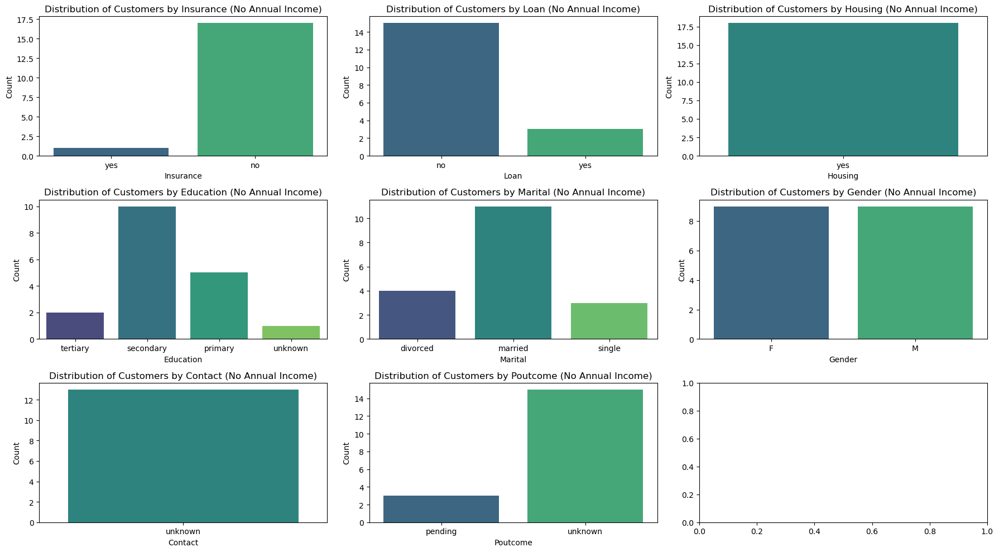

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Annual Income' is the column in your DataFrame (replace with the actual column name)
no_income_customers = merged_df[merged_df['Annual Income'].isnull()]

# Define the columns for visualization
columns_to_visualize = ['Insurance', 'loan', 'housing', 'education', 'marital', 'Gender', 'contact', 'poutcome']
#numeric_to_visulaize-['duration','last_contact_day','campaign','Count_Txn','age']

# Set up subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 10))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Iterate through columns and create countplots
for column, ax in zip(columns_to_visualize, axes):
    sns.countplot(x=column, data=no_income_customers, palette='viridis', ax=ax)
    ax.set_title(f'Distribution of Customers by {column.capitalize()} (No Annual Income)')
    ax.set_xlabel(column.capitalize())
    ax.set_ylabel('Count')

# Adjust layout
plt.tight_layout()
plt.show()





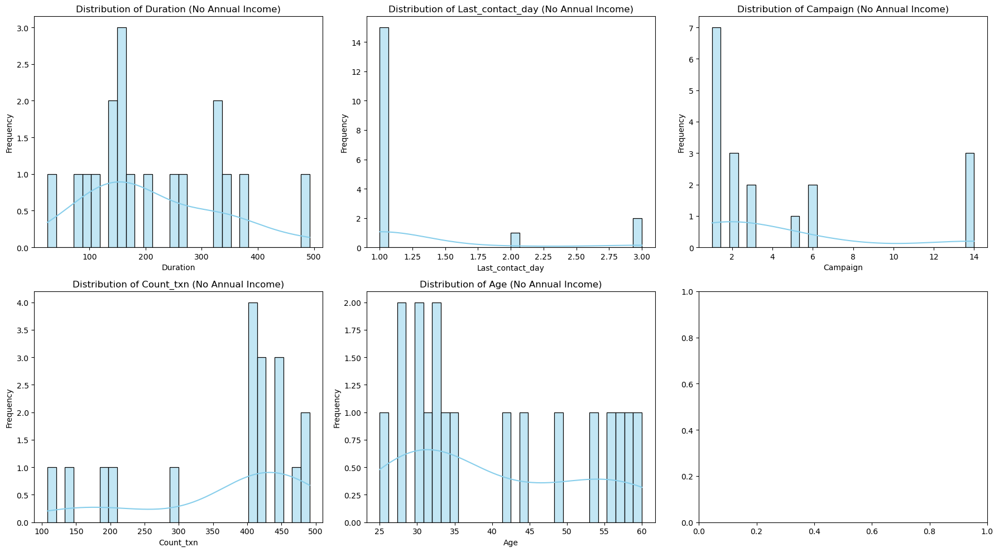

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Annual Income' is the column in your DataFrame (replace with the actual column name)
no_income_customers = merged_df[merged_df['Annual Income'].isnull()]

# Define the numerical columns for visualization
numerical_columns_to_visualize = ['duration', 'last_contact_day', 'campaign', 'Count_Txn', 'age']

# Set up subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))

# Flatten the axes for easy iteration
axes = axes.flatten()

# Iterate through numerical columns and create histograms
for i, column in enumerate(numerical_columns_to_visualize):
    sns.histplot(x=column, data=no_income_customers, bins=30, kde=True, color='skyblue', ax=axes[i])
    axes[i].set_title(f'Distribution of {column.capitalize()} (No Annual Income)')
    axes[i].set_xlabel(column.capitalize())
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()



***In order to replace Null values we have to see the kind of distribution of Data and thereby only we can perform mean/median and mode imputation***

***Numerical Attributes***

***Replace non-numeric values with NaN***

In [24]:
# Replace non-numeric values with NaN in specified columns
columns_to_replace = ['balance', 'duration', 'Count_Txn', 'Annual Income']
merged_df[columns_to_replace] = merged_df[columns_to_replace].apply(pd.to_numeric, errors='coerce')


***Change the unit of 'duration' from seconds to minutes***


In [25]:
# Assuming merged_df is your DataFrame
merged_df['duration'] = merged_df['duration'] / 60


 ***Shapiro-Wilk test for normality***

In [26]:
from scipy.stats import shapiro

# Assuming merged_df is your DataFrame
selected_columns = ['balance', 'duration', 'Count_Txn', 'Annual Income']

# Perform Shapiro-Wilk test for each selected column
for column in selected_columns:
    stat, p_value = shapiro(merged_df[column])
    
    print(f'Shapiro-Wilk test for {column}:')
    print(f'Statistic: {stat}, p-value: {p_value}')
    
    # Check the null hypothesis
    if p_value > 0.05:
        print(f"The data for {column} looks normally distributed (fail to reject the null hypothesis)\n")
    else:
        print(f"The data for {column} does not look normally distributed (reject the null hypothesis)\n")

Shapiro-Wilk test for balance:
Statistic: nan, p-value: 1.0
The data for balance looks normally distributed (fail to reject the null hypothesis)

Shapiro-Wilk test for duration:
Statistic: nan, p-value: 1.0
The data for duration looks normally distributed (fail to reject the null hypothesis)

Shapiro-Wilk test for Count_Txn:
Statistic: nan, p-value: 1.0
The data for Count_Txn looks normally distributed (fail to reject the null hypothesis)

Shapiro-Wilk test for Annual Income:
Statistic: nan, p-value: 1.0
The data for Annual Income looks normally distributed (fail to reject the null hypothesis)



C:\Users\hp\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


***Histogram Plot***

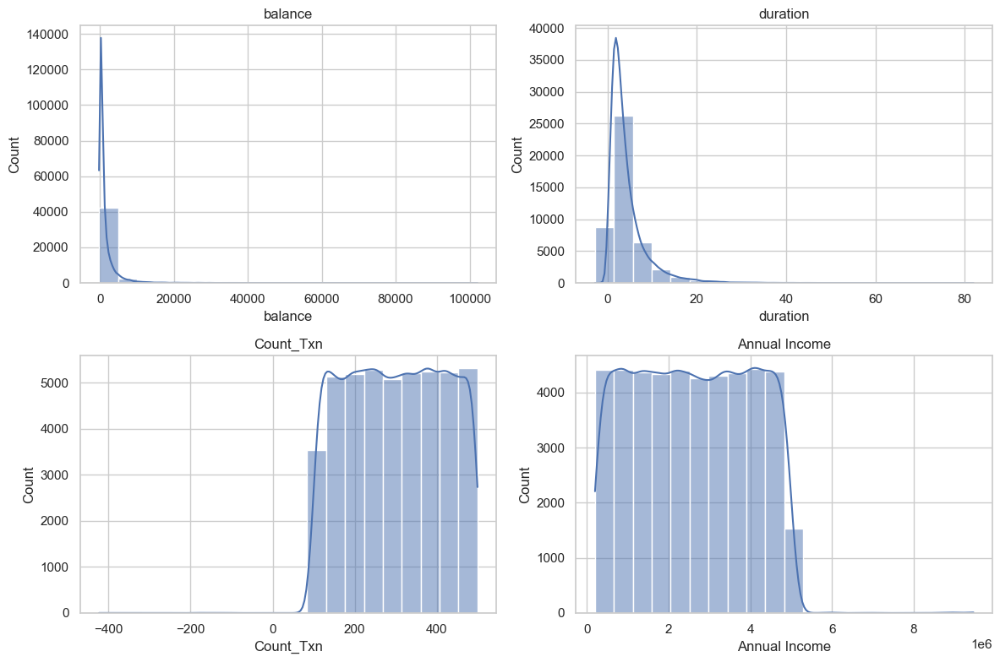

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style (optional)
sns.set(style="whitegrid")

# Assuming merged_df is your DataFrame
columns_to_plot = ['balance', 'duration', 'Count_Txn', 'Annual Income']
# Create a figure with subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Plot histograms for each column
for col, ax in zip(columns_to_plot, axes.flatten()):
    sns.histplot(merged_df[col], kde=True, ax=ax, bins=20)
    ax.set_title(col)

# Adjust layout for better readability
plt.tight_layout()

# Show the plots
plt.show()


***QQ Plot***

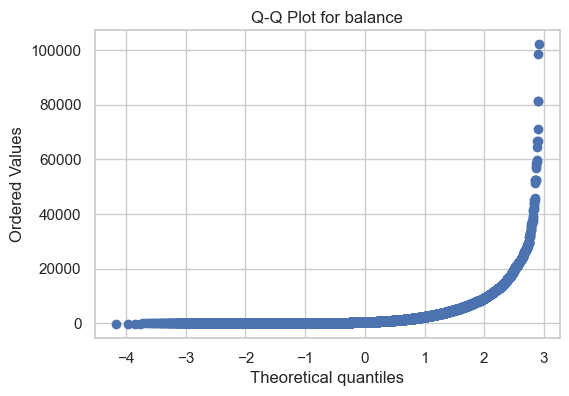

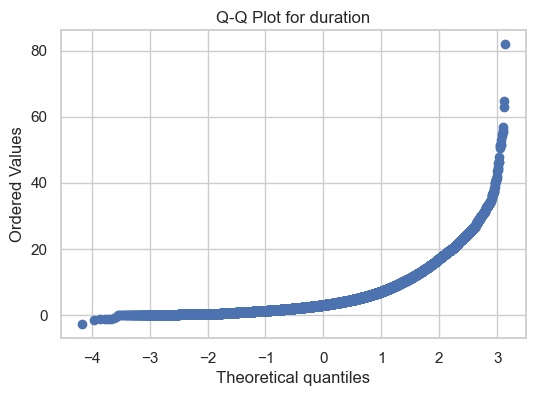

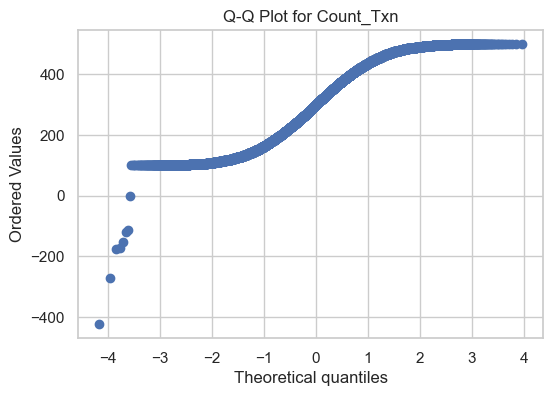

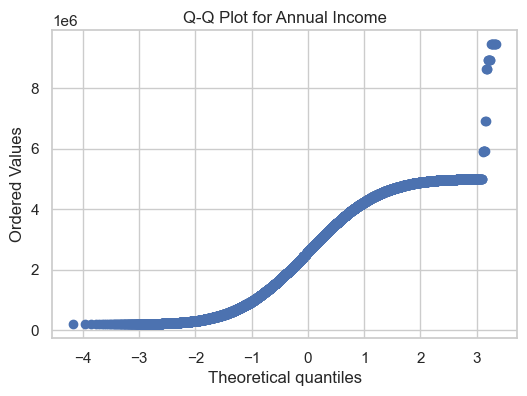

In [28]:
# Assuming merged_df is your DataFrame
selected_columns = ['balance', 'duration', 'Count_Txn', 'Annual Income']

# Create a Q-Q plot for each selected column
for column in selected_columns:
    plt.figure(figsize=(6, 4))
    stats.probplot(merged_df[column], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot for {column}')
    plt.show()


The upward curve and scattered points in the tail suggest that data has a non-normal distribution, with  skewness and heavier tails than the normal distribution.

***Box Plot***

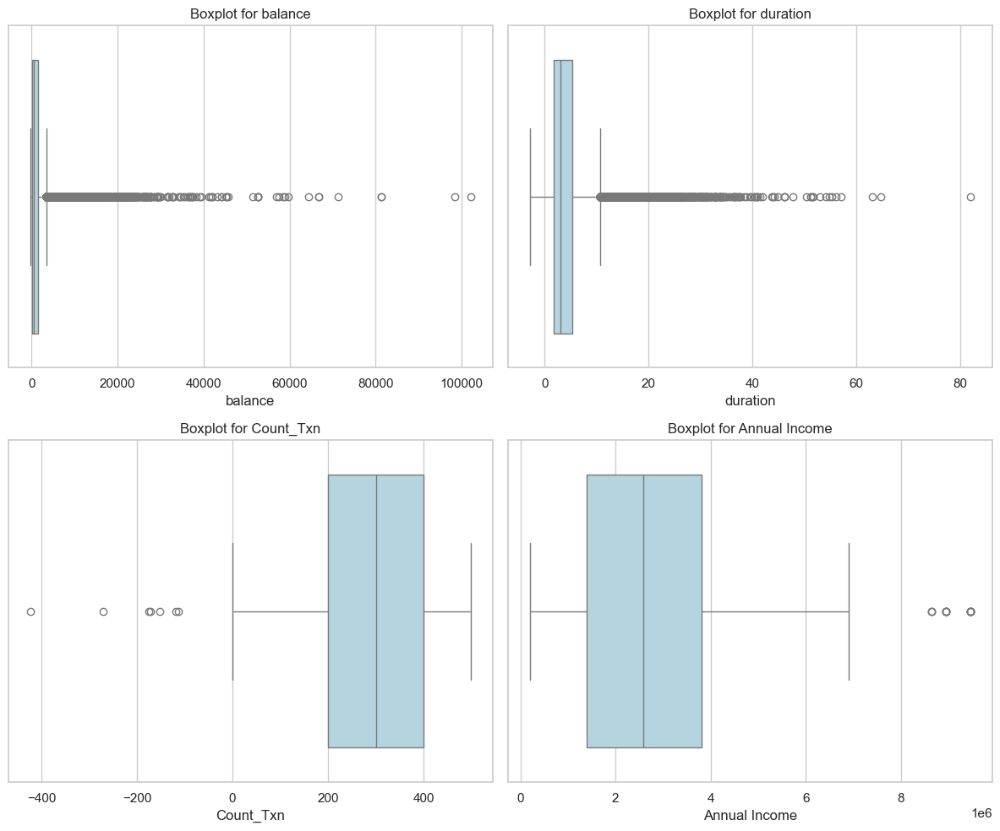

In [29]:
# Assuming merged_df is your DataFrame
selected_columns = ['balance', 'duration', 'Count_Txn', 'Annual Income']

# Set the color palette
sns.set_palette("Blues")

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

# Plot boxplots for each selected column
for i, column in enumerate(selected_columns):
    row = i // 2
    col = i % 2
    sns.boxplot(x=merged_df[column], ax=axes[row, col], color='lightblue')
    axes[row, col].set_title(f'Boxplot for {column}')

# Adjust layout
plt.tight_layout()
plt.show()

**Observation**:

--> Shapiro wilks test is not valid because of the presence of outliers.The test is sensitive to deviations from normality, and in the presence of outliers. Thus, proceed with visuals plots like QQ plot and histograma and box plot.



**Balance**:

-->Balance data are not normally distributed and is higly postively skewed (right tail distribution)  and have lots of outliers (boxplot).

-->The extreme outliers are between 60k to100k euro.


-->The distribution of balance has a huge standard deviation relative to the mean, thus large variablities in customer balance levels (which nee to be look deeper upon)*


-->Outliers need to be treated.

**Duration**:

--->Converted the column from seconds to minutes for better clarity and insights.

-->Duration data are not normally distributed and is positively skewed and have lots of outlier (boxplot)

-->The right skewed boxplot indicate that most calls are relatively short.

-->There is a large no of outliers ranging from 10 mins to 40 mins which also need to look furthur upon.


**Count_Txn**:

-->Even though only one value is missing better not to ignore because the term deposit corresponding to his value is 'yes' which is very crucial for us (very less no of values)

-->Count_Txn is not normally distributed and is negatively skewed (left tail distribution) and have few outliers.

-->The plot indicate that most of the customers are highly engaged (interacting) with the account.

**Annual Income**

-->Annual Income is not normally distributed and is negatively skewed (left tail distribution) and have few outliers.

--> This plot indicate that annual income of the customers range from 1 to 4 million.

-->Thre are 3 customers whose income fall above this range.











**Conclusion: There seems to a high level of skewed  distribution with extreme outliers, the median could be a more robust measure of central tendancy because it is less senstive to extreme values.**



***Replace with Median Values***

In [30]:
# Assuming merged_df is your DataFrame
selected_columns = ['balance', 'duration', 'Count_Txn', 'Annual Income']

# Calculate and print the median value for each selected column
for column in selected_columns:
    median_value = merged_df[column].median()
    print(f'Median value for {column}: {median_value}')


Median value for balance: 486.5
Median value for duration: 3.0
Median value for Count_Txn: 300.0
Median value for Annual Income: 2586789.0


In [31]:
# Assuming merged_df is your DataFrame
selected_columns = ['balance', 'duration', 'Count_Txn', 'Annual Income']

# Replace NaN values with the median value for each selected column
for column in selected_columns:
    median_value = merged_df[column].median()
    merged_df[column].fillna(median_value, inplace=True)
    



In [32]:
merged_df.isnull().sum()

Sno                  0
Customer_number      0
Insurance            0
balance              0
housing              0
loan                 8
contact             43
duration             0
campaign             0
last_contact_day     0
previous             0
poutcome            15
Term Deposit         8
Count_Txn            0
age                  0
job                 13
marital             18
education           21
Annual Income        0
Gender               0
dtype: int64

***Categorical Attributes***

***Count of unique values***

In [33]:
# Assuming merged_df is your DataFrame
selected_columns = ['contact', 'poutcome',  'job', 'marital', 'education']

# Print unique values and counts, and create count plots, pie charts, and count tables for each selected column
for column in selected_columns:
    unique_values = merged_df[column].unique()
    unique_counts = merged_df[column].value_counts()
    
    # Print unique values and counts
    print(f'Unique values and counts for {column}:\n{unique_counts}\n')
    


Unique values and counts for contact:
cellular     29282
unknown      12970
telephone     2850
Mobile          29
Tel             20
?               17
Name: contact, dtype: int64

Unique values and counts for poutcome:
unknown    36884
failure     4901
other       1840
success     1511
pending       55
?              4
????           1
Name: poutcome, dtype: int64

Unique values and counts for job:
blue-collar      9623
management       9455
technician       7595
admin.           5171
services         4153
retired          2264
self-employed    1579
entrepreneur     1486
unemployed       1302
housemaid        1240
student           938
unknown           288
blue collar       104
Name: job, dtype: int64

Unique values and counts for marital:
married     27202
single      12787
divorced     5204
Name: marital, dtype: int64

Unique values and counts for education:
secondary    23187
tertiary     13296
primary       6845
unknown       1857
Primary          3
ter tiary        2
Name: educa

***Replace '?','????' with unknown value***

In [34]:

# Replace specified values with "unknown" in each selected column
for column in selected_columns:
    merged_df[column].replace(['?', '????'], 'unknown', inplace=True)

In [35]:
# Replace specified values with 'tertiary' in the 'education' column
merged_df['education'].replace(['ter tiary'], 'tertiary', inplace=True)
merged_df['education'].replace(['Primary'], 'primary', inplace=True)
merged_df['contact'].replace(['Mobile'], 'cellular', inplace=True)
merged_df['contact'].replace(['Tel'], 'telephone', inplace=True)
merged_df['job'].replace(['blue collar'], 'blue-collar', inplace=True)

In [36]:
# Replace blank values with 'unknown' in each selected column
for column in selected_columns:
    merged_df[column].replace('', 'unknown', inplace=True)
    # Uncomment the line below if you also want to handle NaN values
    merged_df[column].fillna('unknown', inplace=True)

In [37]:
# Assuming merged_df is your DataFrame
selected_columns = ['contact', 'poutcome', 'job', 'marital', 'education']

# Replace 'unknown' with 'other' in selected columns
for column in selected_columns:
    merged_df[column] = merged_df[column].replace('unknown', 'other')


Unique values and counts for contact:
cellular     29311
other        13030
telephone     2870
Name: contact, dtype: int64



C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=merged_df, x=column, palette=palette)
C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  sns.countplot(data=merged_df, x=column, palette=palette)


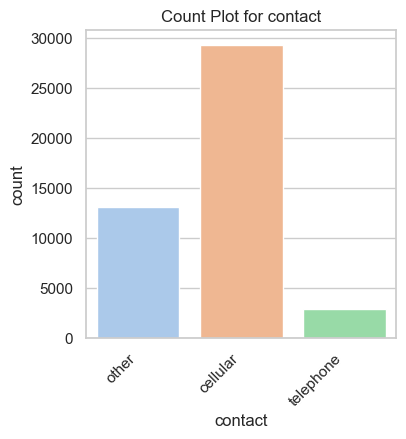

Unique values and counts for poutcome:
other      38744
failure     4901
success     1511
pending       55
Name: poutcome, dtype: int64



C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: UserWarning:

The palette list has more values (10) than needed (4), which may not be intended.



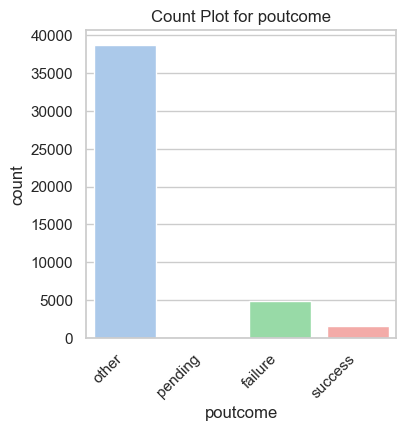

Unique values and counts for job:
blue-collar      9727
management       9455
technician       7595
admin.           5171
services         4153
retired          2264
self-employed    1579
entrepreneur     1486
unemployed       1302
housemaid        1240
student           938
other             301
Name: job, dtype: int64



C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: UserWarning:


The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.



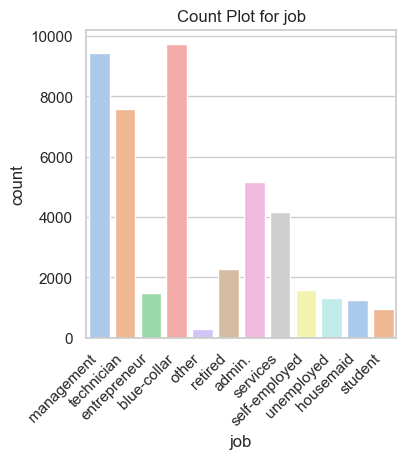

Unique values and counts for marital:
married     27202
single      12787
divorced     5204
other          18
Name: marital, dtype: int64



C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: UserWarning:

The palette list has more values (10) than needed (4), which may not be intended.



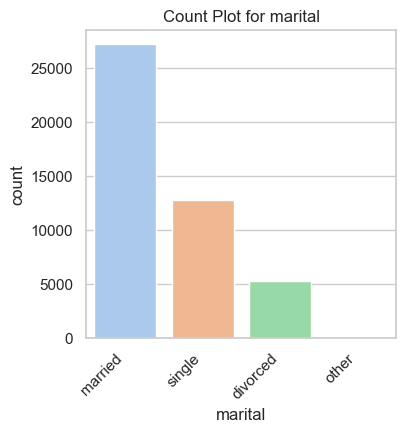

Unique values and counts for education:
secondary    23187
tertiary     13298
primary       6848
other         1878
Name: education, dtype: int64



C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\125561986.py:17: UserWarning:

The palette list has more values (10) than needed (4), which may not be intended.



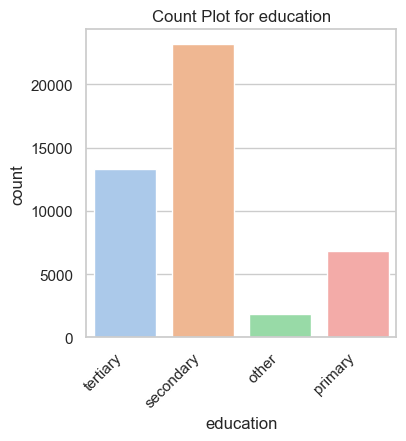

In [38]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

# Set a consistent color palette for both count plot and pie chart
palette = sns.color_palette("pastel")

# Assuming merged_df is your DataFrame containing the data

for column in selected_columns:
    # Print unique values and counts for the current column
    unique_counts = merged_df[column].value_counts()
    print(f'Unique values and counts for {column}:\n{unique_counts}\n')

    # Create a count plot
    plt.figure(figsize=(4, 4))
    sns.countplot(data=merged_df, x=column, palette=palette)
    plt.title(f'Count Plot for {column}')
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    
    plt.show()

    # Create a pie chart
    fig = px.pie(merged_df, names=column, title=f'Donut Chart for {column}', hole=0.4)

    # Customize label positioning and formatting
    fig.update_traces(textinfo='percent+label', pull=[0.1] * len(merged_df[column].unique()), insidetextorientation='radial')

    # Show the pie chart
    fig.show()




C:\Users\hp\AppData\Local\Temp\ipykernel_1552\504348861.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\504348861.py:9: UserWarning:

The palette list has more values (10) than needed (2), which may not be intended.



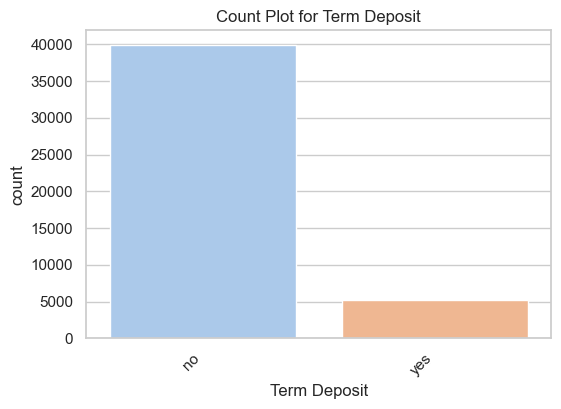

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a consistent color palette
palette = sns.color_palette("pastel")

# Create a count plot for the 'contact' column
plt.figure(figsize=(6, 4))
sns.countplot(data=merged_df, x='Term Deposit', palette=palette)
plt.title('Count Plot for Term Deposit')
# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.show()


**Observations:**

**Contact**

-->Around 64% of mode of client communication was using mobile phone. Understanding the call duration along with this provide a significant impact on conversaion rate.(ie, higher conversion rate generally means a higher percentage of successful outcomes, such as turning potential customers into actual customers.)

-->landline usage exhibits a notably low share as a means of client communication. This observation underscores the dominance of mobile communication, surpassing all other modes.

--> Around 28% of people's mode of communication is not captured here thus, we cannot infer from this.We need to resample the data to gain insights from this.

**Poutcome**

**Term Deposit**

--> It is is imbalanced state we need to oversample the no of minority class (yes).

**Job**

-->The bank predominantly targeted individuals in blue-collar, management, and technician professions. 

-->Customers classified as unemployed, housemaids, and students. This decision, though these groups represent a minority, may not be optimal, as they are less likely to convert into fixed deposit customers.

-->

**Martial Status**

-->Approximately half of the customers, are married. This aligns with expectations, considering that married individuals often prioritize savings.

--> About 28% of the customers are classified as single. Anticipating a potentially higher conversion rate from this group, especially among young, single working professionals. 

--->Accounting for 11%, there are customers labeled as divorced. It is not anticipated that this group will exhibit a high likelihood of converting to fixed deposit customers. 

**Education**

-->With a higher education level, individuals may have a better understanding of various investment options, including fixed deposits.

-->There are chances that that a significant portion of tertiary-educated customers might consider fixed deposits as part of their investment portfolio. So our focus should be ont his category. we need to a bivariate analysis to furthur validate this point.

-->if the secondary group prioritize stability and security in their investments chance can be move from moderate to high in the fixed deposit investment. For that campaign should be focused ont this section.


-->customers are still studying and have completed only primary education should not be our target audience.They are very less liskely to take fd option. 

In [40]:
# Print the percentage of 'unknown' values for each selected column
for column in selected_columns:
    unknown_percentage = (merged_df[column] == 'other').sum() / len(merged_df) * 100
    print(f'Percentage of "unknown" values in {column}: {unknown_percentage:.2f}%')

Percentage of "unknown" values in contact: 28.82%
Percentage of "unknown" values in poutcome: 85.70%
Percentage of "unknown" values in job: 0.67%
Percentage of "unknown" values in marital: 0.04%
Percentage of "unknown" values in education: 4.15%


# ***3. Exploratory Data Analysis***

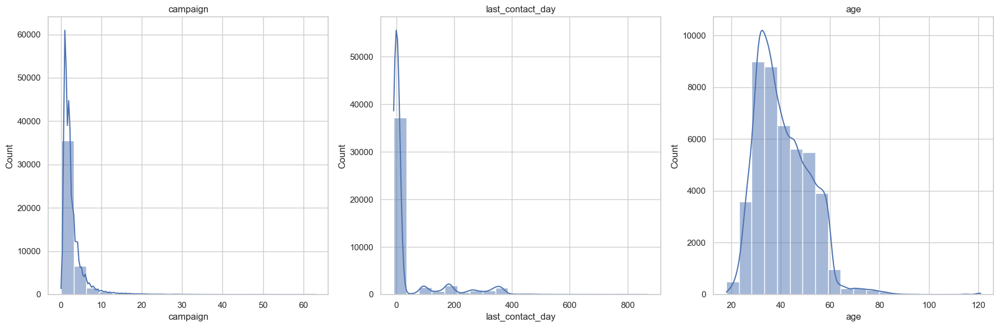

In [41]:
# Set the style (optional)
sns.set(style="whitegrid")

# Define the columns for which you want to create histograms
columns_to_plot = ['campaign', 'last_contact_day', 'age']

# Create a figure with subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Plot histograms for each column
for col, ax in zip(columns_to_plot, axes):
    sns.histplot(merged_df[col], kde=True, ax=ax, bins=20)
    ax.set_title(col)

# Adjust layout for better readability
plt.tight_layout()

# Show the plots
plt.show()


In [42]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45211 entries, 0 to 45210
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Sno               45211 non-null  int64  
 1   Customer_number   45211 non-null  int64  
 2   Insurance         45211 non-null  object 
 3   balance           45211 non-null  float64
 4   housing           45211 non-null  object 
 5   loan              45203 non-null  object 
 6   contact           45211 non-null  object 
 7   duration          45211 non-null  float64
 8   campaign          45211 non-null  int64  
 9   last_contact_day  45211 non-null  int64  
 10  previous          45211 non-null  int64  
 11  poutcome          45211 non-null  object 
 12  Term Deposit      45203 non-null  object 
 13  Count_Txn         45211 non-null  float64
 14  age               45211 non-null  int64  
 15  job               45211 non-null  object 
 16  marital           45211 non-null  object

**QQ plot**

C:\Users\hp\anaconda3\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.2980392156862745, 0.4470588235294118, 0.6901960784313725, 1)). The keyword argument will take precedence.



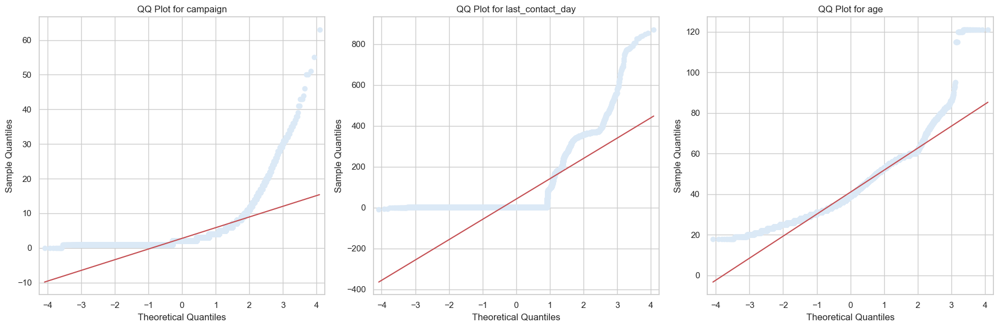

In [43]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns

# Define the columns for which you want to create QQ plots
selected_columns = ['campaign', 'last_contact_day', 'age']

# Set the color palette
sns.set_palette("Blues")

# Create subplots with one row and three columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Plot QQ plots for each selected column
for i, column in enumerate(selected_columns):
    sm.qqplot(merged_df[column], line='s', ax=axes[i], color='lightblue')
    axes[i].set_title(f'QQ Plot for {column}')

# Adjust layout
plt.tight_layout()
plt.show()


**boxplot**

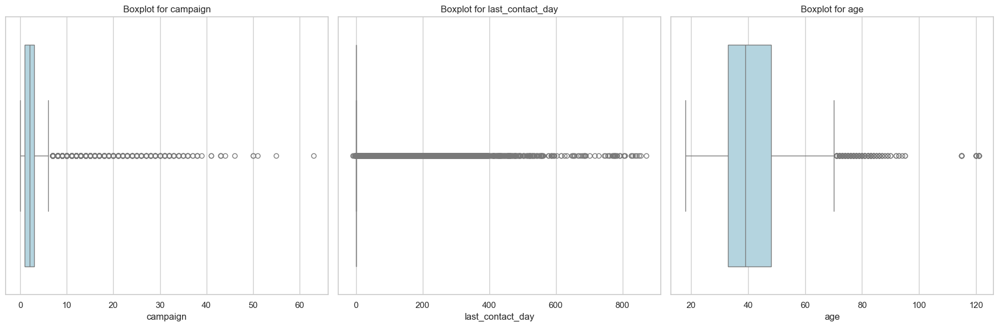

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the columns for which you want to create boxplots
selected_columns = ['campaign', 'last_contact_day', 'age']

# Set the color palette
sns.set_palette("Blues")

# Create subplots with one row and three columns
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Plot boxplots for each selected column
for i, column in enumerate(selected_columns):
    sns.boxplot(x=merged_df[column], ax=axes[i], color='lightblue')
    axes[i].set_title(f'Boxplot for {column}')

# Adjust layout
plt.tight_layout()
plt.show()


In [45]:
# Define custom age categories
age_categories = {
    'Young Adult': (20, 35),
    'Adult': (36, 60),
    'Senior Citizen': (61, 120)
}

# Create a new column 'age_category' in the DataFrame
merged_df['age_category'] = pd.cut(merged_df['age'], bins=[age[0] for age in age_categories.values()] + [float('inf')],
                                   labels=age_categories.keys(), right=False)

In [46]:
merged_df['age_category']

0                 Adult
1                 Adult
2           Young Adult
3                 Adult
4           Young Adult
              ...      
45206             Adult
45207    Senior Citizen
45208    Senior Citizen
45209             Adult
45210             Adult
Name: age_category, Length: 45211, dtype: category
Categories (3, object): ['Young Adult' < 'Adult' < 'Senior Citizen']

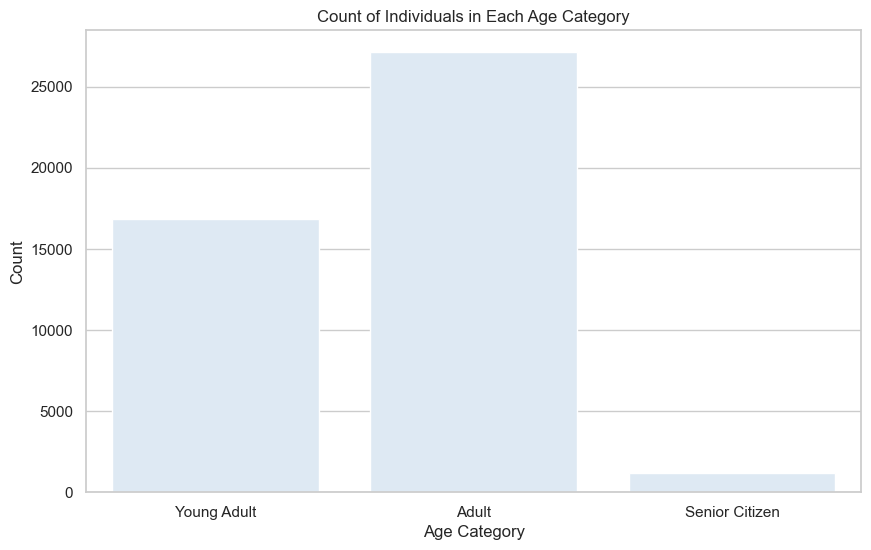

In [47]:
# Set the color palette
sns.set_palette("Blues")

# Create a countplot for 'age_category'
plt.figure(figsize=(10, 6))
sns.countplot(x='age_category', data=merged_df, order=age_categories.keys())

# Add labels and title
plt.xlabel('Age Category')
plt.ylabel('Count')
plt.title('Count of Individuals in Each Age Category')

# Show the plot
plt.show()


In [48]:
merged_df

,Sno,Customer_number,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,...,poutcome,Term Deposit,Count_Txn,age,job,marital,education,Annual Income,Gender,age_category
0,0,1001,no,2143.0,yes,no,other,4.350000,1,2,...,other,no,351.0,58,management,married,tertiary,839368.0,M,Adult
1,1,1002,no,29.0,yes,no,other,2.516667,1,2,...,other,no,326.0,44,technician,single,secondary,1452858.0,M,Adult
2,2,1003,no,2.0,yes,yes,other,1.266667,1,2,...,other,no,422.0,33,entrepreneur,married,other,4851383.0,F,Young Adult
3,3,1004,no,1506.0,yes,no,other,1.533333,1,2,...,other,no,113.0,47,blue-collar,married,other,3207754.0,F,Adult
4,4,1005,no,1.0,no,no,other,3.300000,1,2,...,other,no,342.0,33,other,single,other,2562322.0,M,Young Adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,45206,46207,no,825.0,no,no,cellular,0.000000,0,-1,...,other,yes,152.0,51,technician,married,tertiary,2229818.0,M,Adult
45207,45207,46208,no,1729.0,no,no,cellular,0.000000,0,-1,...,other,yes,334.0,121,retired,divorced,primary,2783556.0,M,Senior Citizen
45208,45208,46209,no,5715.0,no,no,cellular,18.783333,5,184,...,success,yes,381.0,72,retired,married,secondary,443512.0,M,Senior Citizen
45209,45209,46210,no,668.0,no,no,telephone,0.000000,0,-1,...,other,no,211.0,57,blue-collar,married,secondary,4193684.0,F,Adult


**Observations:Most of the customers**

**Bivariate Analysis**

**2. Loan-less Customers Profile:
    Filter out customers who don’t have any type of loan. Plot the distribution of their Income, balance, and profession. How do these metrics differ from those with loans?**


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\1230543836.py:20: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




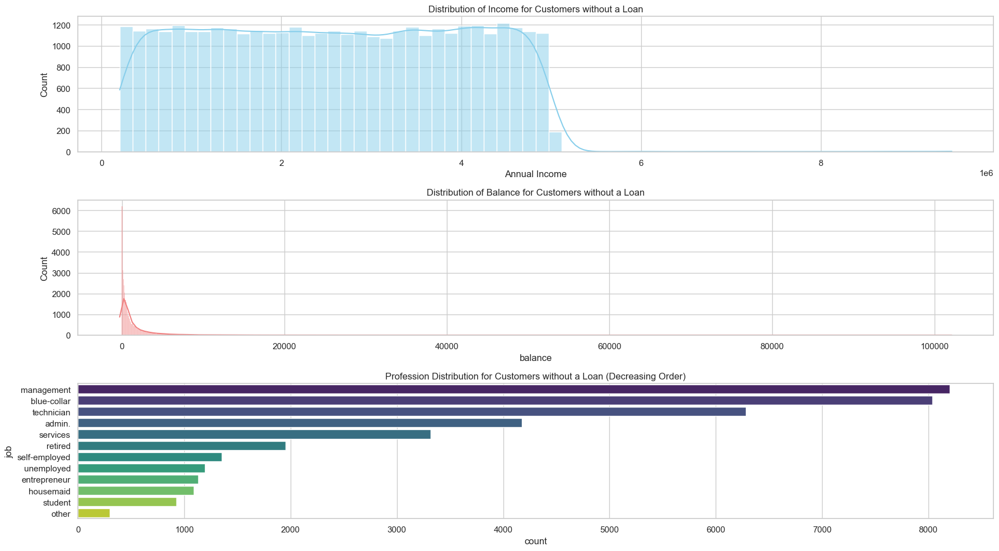

C:\Users\hp\AppData\Local\Temp\ipykernel_1552\1230543836.py:38: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




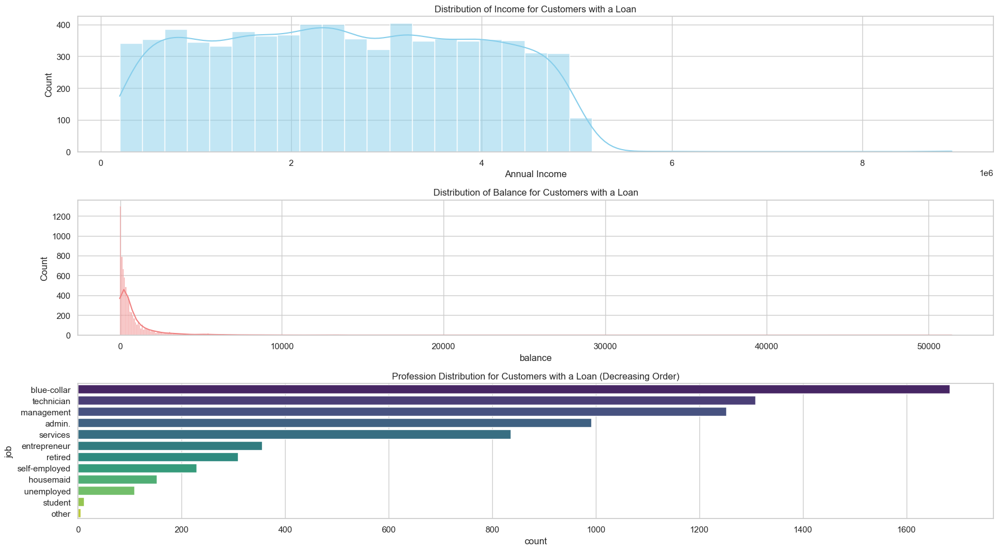

In [49]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'loan', 'Annual Income', 'balance', and 'job' are columns in your DataFrame (replace with actual column names)
loanless_customers = merged_df[merged_df['loan'] == 'no']

# Plot the distribution of Income, balance, and profession for customers without any loan
plt.figure(figsize=(18, 10))

plt.subplot(3, 1, 1)
sns.histplot(loanless_customers['Annual Income'], kde=True, color='skyblue')
plt.title('Distribution of Income for Customers without a Loan')

plt.subplot(3, 1, 2)
sns.histplot(loanless_customers['balance'], kde=True, color='lightcoral')
plt.title('Distribution of Balance for Customers without a Loan')

plt.subplot(3, 1, 3)
sns.countplot(y=loanless_customers['job'], order=loanless_customers['job'].value_counts().index, palette='viridis')
plt.title('Profession Distribution for Customers without a Loan (Decreasing Order)')

plt.tight_layout()
plt.show()

# Compare these metrics with those of customers with loans
plt.figure(figsize=(18, 10))

plt.subplot(3, 1, 1)
sns.histplot(merged_df[merged_df['loan'] == 'yes']['Annual Income'], kde=True, color='skyblue')
plt.title('Distribution of Income for Customers with a Loan')

plt.subplot(3, 1, 2)
sns.histplot(merged_df[merged_df['loan'] == 'yes']['balance'], kde=True, color='lightcoral')
plt.title('Distribution of Balance for Customers with a Loan')

plt.subplot(3, 1, 3)
sns.countplot(y=merged_df[merged_df['loan'] == 'yes']['job'], order=merged_df[merged_df['loan'] == 'yes']['job'].value_counts().index, palette='viridis')
plt.title('Profession Distribution for Customers with a Loan (Decreasing Order)')

plt.tight_layout()
plt.show()


**3. Loan and Insurance Analysis:
•	Calculate the percentage of customers with a loan who have taken out insurance. Visualize this data and discuss potential implications.**


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\1010462346.py:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




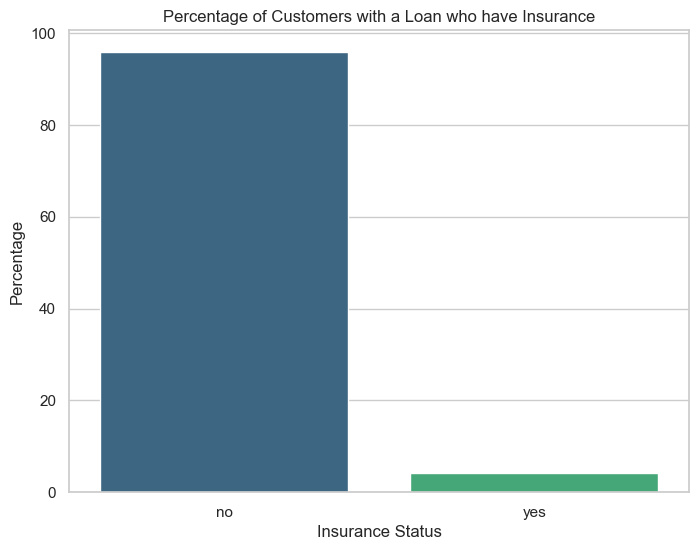

Percentage of customers with a loan who have insurance:
no     95.844837
yes     4.155163
Name: Insurance, dtype: float64


In [50]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'loan' and 'Insurance' are columns in your DataFrame (replace with actual column names)
loan_insurance_data = merged_df[['loan', 'Insurance']]

# Calculate the percentage of customers with a loan who have taken out insurance
loan_insurance_percentage = (
    loan_insurance_data[loan_insurance_data['loan'] == 'yes']['Insurance'].value_counts(normalize=True) * 100
)

# Visualize the results
plt.figure(figsize=(8, 6))
sns.barplot(x=loan_insurance_percentage.index, y=loan_insurance_percentage.values, palette='viridis')
plt.title('Percentage of Customers with a Loan who have Insurance')
plt.xlabel('Insurance Status')
plt.ylabel('Percentage')
plt.show()

# Display the percentage values
print("Percentage of customers with a loan who have insurance:")
print(loan_insurance_percentage)


***4. Communication Strategy Insights: Analyse and summarize the best Contact method (with the highest success percentage) to contact people to ascertain the status of term deposit subscriptions.***


C:\Users\hp\AppData\Local\Temp\ipykernel_1552\1322099343.py:13: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




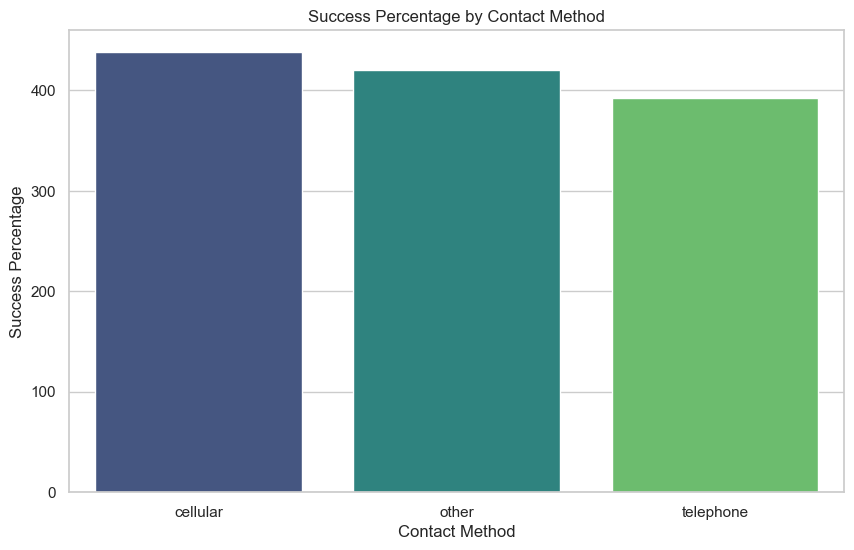

In [51]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'contact' and 'poutcome_success' are columns in your DataFrame (replace with actual column names)
contact_success = merged_df[['contact', 'duration']]

# Calculate success percentage by contact method
success_percentage = contact_success.groupby('contact')['duration'].mean() * 100

# Visualize the results
plt.figure(figsize=(10, 6))
sns.barplot(x=success_percentage.index, y=success_percentage.values, palette='viridis')
plt.title('Success Percentage by Contact Method')
plt.xlabel('Contact Method')
plt.ylabel('Success Percentage')
plt.show()


**5. Age and Home Loans:
•	Determine which age group has the highest percentage of home loans. Present this data visually and discuss possible reasons.**





C:\Users\hp\AppData\Local\Temp\ipykernel_1552\2697580341.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\hp\AppData\Local\Temp\ipykernel_1552\2697580341.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




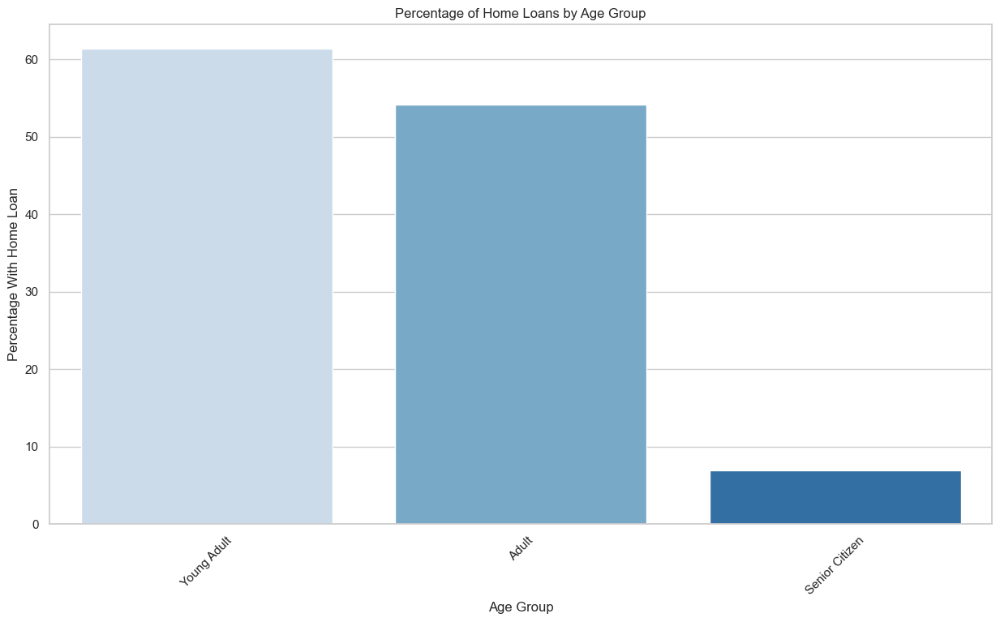

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'age' and 'housing' are columns in your DataFrame (replace with actual column names)
age_loan_data = merged_df[['age_category', 'housing']]

# Create a new column 'home_loan' to represent whether the individual has a home loan or not
age_loan_data['home_loan'] = age_loan_data['housing'].apply(lambda x: 'With Home Loan' if x == 'yes' else 'Without Home Loan')

# Group by age and calculate the percentage of each category
age_loan_percentage = age_loan_data.groupby(['age_category', 'home_loan']).size().unstack(fill_value=0)
age_loan_percentage['Total'] = age_loan_percentage.sum(axis=1)
age_loan_percentage['Percentage With Home Loan'] = (age_loan_percentage['With Home Loan'] / age_loan_percentage['Total']) * 100

# Plotting the data
plt.figure(figsize=(15, 8))
sns.barplot(x=age_loan_percentage.index, y='Percentage With Home Loan', data=age_loan_percentage, palette='Blues')
plt.title('Percentage of Home Loans by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Percentage With Home Loan')
plt.xticks(rotation=45)
plt.show()


People in the 'Young Adult' and 'Adult' age groups may be at stages in their lives where they are more likely to make significant financial decisions, such as purchasing a home. Young adults might be entering the housing market for the first time, and adults may be upgrading to larger homes for family needs.

Stability and Income: Individuals in these age groups may have reached a level of stability in their careers, leading to higher income levels. Increased financial stability can make it easier to qualify for a mortgage and handle the financial responsibilities of homeownership.

Family Considerations: The desire to provide a stable home environment for a growing family could be a motivating factor for individuals in these age groups to purchase a home.

Investment and Wealth Building: Homeownership is often viewed as a long-term investment and a means of building wealth. Young adults and adults may see homeownership as a way to invest in their future and secure financial stability.



**6. Income and Age Relationship:
•	Investigate any relationships between annual income and age group. Use appropriate plots and statistics to present the findings.**


In [53]:
!pip install --upgrade seaborn



Shapiro-Wilk test for Young Adult: p-value = 0.0


C:\Users\hp\anaconda3\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning:

p-value may not be accurate for N > 5000.



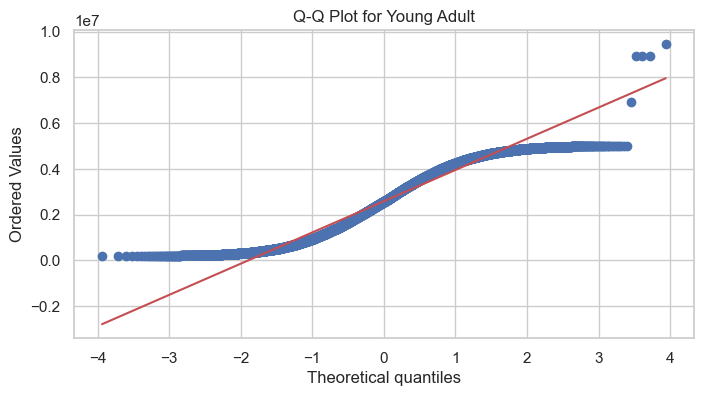

Shapiro-Wilk test for Adult: p-value = 0.0


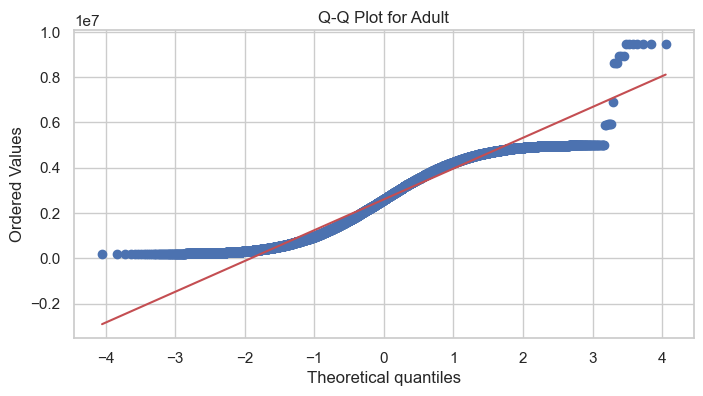

Shapiro-Wilk test for Senior Citizen: p-value = 8.475095687232534e-18


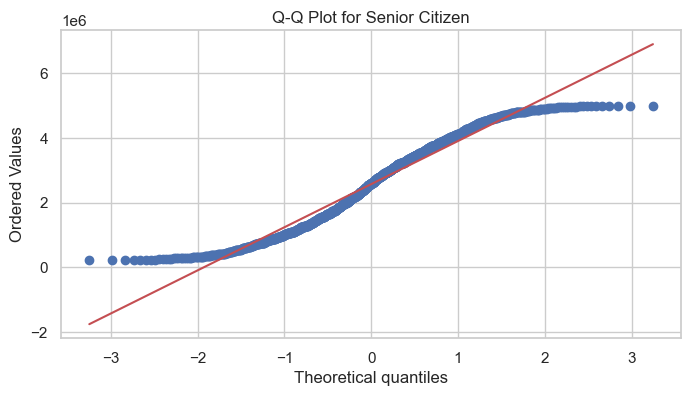

In [54]:
import scipy.stats as stats
import matplotlib.pyplot as plt

# Assuming 'Annual Income' and 'age_category' are columns in your DataFrame (replace with actual column names)
for category, group in merged_df.groupby('age_category'):
    # Shapiro-Wilk test for normality
    _, p_value = stats.shapiro(group['Annual Income'])
    
    print(f"Shapiro-Wilk test for {category}: p-value = {p_value}")

    # Q-Q plot
    plt.figure(figsize=(8, 4))
    stats.probplot(group['Annual Income'], dist='norm', plot=plt)
    plt.title(f'Q-Q Plot for {category}')
    plt.show()


***Normality is not statistfied so we proceed with  no paramteric Kruskal-Wallis test (non-parametric equivalent of ANOVA)**

Null Hypothesis (H₀):
There is no significant difference in the median annual income among the 'Young Adult,' 'Adult,' and 'Senior Citizen' age categories.

Alternative Hypothesis (H₁):
There is a significant difference in the median annual income among the 'Young Adult,' 'Adult,' and 'Senior Citizen' age categories.

In [55]:
import scipy.stats as stats

# Assuming 'Annual Income' and 'age_category' are columns in your DataFrame (replace with actual column names)
young_adult = merged_df[merged_df['age_category'] == 'Young Adult']['Annual Income']
adult = merged_df[merged_df['age_category'] == 'Adult']['Annual Income']
senior_citizen = merged_df[merged_df['age_category'] == 'Senior Citizen']['Annual Income']

# Perform Kruskal-Wallis test
statistic, p_value = stats.kruskal(young_adult, adult, senior_citizen)

# Print the Kruskal-Wallis test results
print("Kruskal-Wallis Test:")
print(f"H-statistic: {statistic}")
print(f"P-value: {p_value}")


Kruskal-Wallis Test:
H-statistic: 1.7668319111513278
P-value: 0.41336844892811486


**p-value is below a chosen significance level (e.g., 0.05), you may reject the null hypothesis ***


**Result:The Kruskal-Wallis test suggests that there are no significant differences in annual income across the 'Young Adult,' 'Adult,' and 'Senior Citizen' age categories.**

In [ ]:
# Assuming 'age_category' is the column you want to remove
merged_df = merged_df.drop(columns=['age_category'])

In [ ]:
merged_df_copy=merged_df

***Encode the Categorical Column***

**One hot Encoding**

In [ ]:
import pandas as pd

# Assuming df is your DataFrame
df_encoded = pd.get_dummies(merged_df, columns=['Insurance', 'housing', 'loan', 'contact', 'poutcome','marital', 'Gender'], prefix=['ins', 'house', 'loan', 'contact', 'poutcome', 'marital', 'gender'])

# Display the DataFrame with one-hot encoding
df_encoded


**Label Encoding**

In [ ]:
# Assuming df is your DataFrame
le = LabelEncoder()
df_encoded['education'] = le.fit_transform(df_encoded['education'])
df_encoded



In [ ]:
df_encoded['education']

**Frequency Encoding:**

In [ ]:
# Assuming df is your DataFrame
job_counts = {
    'blue-collar': 0,
    'management': 1,
    'technician': 2,
    'admin.': 3,
    'services': 4,
    'retired': 5,
    'self-employed': 6,
    'entrepreneur': 7,
    'unemployed': 8,
    'housemaid': 9,
    'student': 10,
    'other': 11
}

# Create a new column 'job_encoded' based on manual labeling
df_encoded['job'] = df_encoded['job'].map(job_counts)
df_encoded



In [ ]:
df_encoded['job']

In [ ]:
import pandas as pd

# Assuming df_encoded is your DataFrame with the 'job_encoded' column
df_encoded['education'] = pd.to_numeric(df_encoded['education'], errors='coerce')

# Check the data types after conversion
print(df_encoded.dtypes)


In [ ]:

df_encoded['Term Deposit'] = df_encoded['Term Deposit'].map({'yes': 1, 'no': 0})


In [ ]:
# Check the data types after conversion
print(df_encoded.dtypes)


In [ ]:
import pandas as pd

# Assuming df_encoded is your DataFrame
df_nan_values = df_encoded.loc[df_encoded['Term Deposit'].isna()].copy()

# Print the DataFrame with NaN values
df_nan_values


In [ ]:
df_encoded_new=df_encoded
# Assuming df_encoded is your DataFrame
df_encoded_new = df_encoded_new.dropna(subset=['Term Deposit'])

# Check the result
df_encoded_new


In [ ]:
df_encoded_new.isnull().sum()

**Heatmap**

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your DataFrame with the specified columns
columns_to_visualize = ['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']

# Create a correlation matrix
correlation_matrix = df_encoded_new[columns_to_visualize].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Add title
plt.title('Correlation Heatmap')

# Show the plot
plt.show()



***Observation:“campaign ” has a strong correlation with “duration”and “last_day_contacts”***

**Remove the unwanted columns**

-->It seems that large share of poutcome results which accounts for 85% has not meaningful insight.This make the outcome insignificant

--> As contact has almost 29 % data which has uknown value it has no significant role to play in predciting the model outcome. 
  - contact type seems to be not so important feature here so we can drop it form the dataframe  

In [ ]:
! pip install imbalanced-learn

In [ ]:
pip install --user imbalanced-learn


**Remove Unwanted Columns**

In [ ]:
# Assuming merged_df is your DataFrame
df_encoded_new = df_encoded_new.drop(['Sno', 'Customer_number'], axis=1)

**Feature Scaling**

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming df_encoded_new is your DataFrame
# Assuming that you want to scale specific numeric columns

# Extracting numeric columns
numeric_columns = df_encoded_new.select_dtypes(include=['float64', 'int64']).columns

# Creating a StandardScaler instance
scaler = StandardScaler()

# Scaling the numeric columns
df_encoded_new[['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']] = scaler.fit_transform(df_encoded_new[['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']])

# Check the scaled DataFrame
df_encoded_new



***Split the Dependent and Independent Features***

In [ ]:
# Specify the target column
target_column ='Term Deposit'

# Extract features (independent variables)
X = df_encoded_new.drop(target_column, axis=1)

# Extract the target variable
y = df_encoded_new[target_column]

***Split Train and Test Data***

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes of the resulting sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

***Define the Model***

In [ ]:
pip install xgboost

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, f1_score, precision_score, recall_score, roc_curve, auc, average_precision_score, accuracy_score, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

class ModelEvaluator:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test

    def cross_val(self, model):
        accuracies = cross_val_score(estimator=model, X=self.X_train, y=self.y_train, cv=5)
        return accuracies.mean()
    
    def training_accuracy_score(self, model):
        model_pred_train = model.predict(self.X_train)
        accu_score_train = accuracy_score(self.y_train, model_pred_train)
        return accu_score_train



    def test_accuracy_score(self, model):
        model_pred = self.fit_test_model(model)
        accu_score = accuracy_score(self.y_test, model_pred)
        return accu_score

    def fit_test_model(self, model):
        model.fit(self.X_train, self.y_train)
        model_pred = model.predict(self.X_test)
        return model_pred

    def recallscore_class_0(self, model):
        model_pred = self.fit_test_model(model)
        recall = recall_score(self.y_test, model_pred, pos_label=0)
        return recall

    def recallscore_class_1(self, model):
        model_pred = self.fit_test_model(model)
        recall = recall_score(self.y_test, model_pred, pos_label=1)
        return recall

    def f1score_0(self, model):
        model_pred = self.fit_test_model(model)
        f1 = f1_score(self.y_test, model_pred, pos_label=0)
        return f1

    def f1score_1(self, model):
        model_pred = self.fit_test_model(model)
        f1 = f1_score(self.y_test, model_pred, pos_label=1)
        return f1

    def precision_score(self, model):
        model_pred = self.fit_test_model(model)
        precision = precision_score(self.y_test, model_pred)
        return precision

    def classificationreport(self, model):
        model_pred = self.fit_test_model(model)
        report = classification_report(self.y_test, model_pred)
        return report

    def draw_confmatrix(self, model, label_0, label_1):
        model_pred = self.fit_test_model(model)
        cm = confusion_matrix(self.y_test, model_pred)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=[label_0, label_1],
                    yticklabels=[label_0, label_1])
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

    def roc_auc_curve(self, model, title):
        if hasattr(model, "decision_function"):
            y_score = model.decision_function(self.X_test)
        elif hasattr(model, "predict_proba"):
            y_score = model.predict_proba(self.X_test)[:, 1]
        else:
            raise AttributeError("Model does not have decision_function or predict_proba method.")

        fpr, tpr, _ = roc_curve(self.y_test, y_score)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(4, 4))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(title)
        plt.legend(loc='lower right')
        plt.show()

    def prec_recall_curve(self, model, title):
        if hasattr(model, "decision_function"):
            y_score = model.decision_function(self.X_test)
        elif hasattr(model, "predict_proba"):
            y_score = model.predict_proba(self.X_test)[:, 1]
        else:
            raise AttributeError("Model does not have decision_function or predict_proba method.")

        precision, recall, _ = precision_recall_curve(self.y_test, y_score)
        avg_precision = average_precision_score(self.y_test, y_score)

        plt.figure(figsize=(4, 4))
        plt.step(recall, precision, color='b', where='post', alpha=0.2)
        plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.ylim([0.0, 1.05])
        plt.xlim([0.0, 1.0])
        plt.title('{}: AP={:.2f}'.format(title, avg_precision))
        plt.show()
# Function to print results for a model
def print_model_results(model_evaluator, model):
    print(f"\nResults for {model.__class__.__name__}:\n")
    
    # Fit and evaluate the model on training data
    model_evaluator.fit_test_model(model)  # Add this line to fit the model


    # Fit and evaluate the model
    model_cross_val_result = model_evaluator.cross_val(model)
    print(f"Cross-Validation Accuracy: {model_cross_val_result}")
    
    # Training Accuracy Score
    accu_score_train = model_evaluator.training_accuracy_score(model)
    print(f"Training Accuracy Score: {accu_score_train}")

    # Accuracy Score
    accu_score_test = model_evaluator.test_accuracy_score(model)
    print(f"Testing Accuracy Score: {accu_score_test}")

    # Precision Score
    precision = model_evaluator.precision_score(model)
    print(f"Precision Score: {precision}")

    # Recall Score for Class 0
    recall_0 = model_evaluator.recallscore_class_0(model)
    print(f"Recall Score (Class 0): {recall_0}")

    # Recall Score for Class 1
    recall_1 = model_evaluator.recallscore_class_1(model)
    print(f"Recall Score (Class 1): {recall_1}")

    # F1 Score for Class 0
    f1_0 = model_evaluator.f1score_0(model)
    print(f"F1 Score (Class 0): {f1_0}")

    # F1 Score for Class 1
    f1_1 = model_evaluator.f1score_1(model)
    print(f"F1 Score (Class 1): {f1_1}")

    # Classification Report
    class_report = model_evaluator.classificationreport(model)
    print(f"Classification Report:\n{class_report}")

    # Confusion Matrix
    model_evaluator.draw_confmatrix(model, "No Default", "Default")

    # ROC-AUC Curve
    model_evaluator.roc_auc_curve(model, f"ROC-AUC Curve for {model.__class__.__name__}")
    plt.show()

    # Precision-Recall Curve
    model_evaluator.prec_recall_curve(model, f"Prec-Recall Curve for {model.__class__.__name__}")
    plt.show()

    print("=" * 50)
    
# Training Accuracy Score
accu_score_train = model_evaluator.training_accuracy_score(model)
print(f"Training Accuracy Score: {accu_score_train}")


# Example usage:
# Assuming X_train, y_train, X_test, y_test are defined
#model_evaluator = ModelEvaluator(X_train, y_train, X_test, y_test)

# Models to Fit & Evaluate
models = [
    LogisticRegression(),
    KNeighborsClassifier(),
    GaussianNB(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    AdaBoostClassifier(),
    XGBClassifier()
]

# Print results for each model
for model in models:
    print_model_results(model_evaluator, model)



**Data Imbalance**

**Oversample Using SMOTHE Method**

In [ ]:
pip install --upgrade scikit-learn imbalanced-learn


In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
pip install --upgrade scikit-learn


In [ ]:
pip install --upgrade threadpoolctl


In [ ]:
pip install --upgrade openblas


In [ ]:
# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Upsample the minority class in the training set
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the shape of the resampled training set
print("X_train_resampled shape:", X_train_resampled.shape)
print("y_train_resampled shape:", y_train_resampled.shape)

***Comparison Before after Sampling***

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming y_train is the original target column
print("Original class distribution:")
print(y_train.value_counts())

# Assuming y_train_resampled is the target column after SMOTE
print("\nClass distribution after SMOTE:")
print(pd.Series(y_train_resampled).value_counts())

# Create count plots
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.countplot(x=y_train)
plt.title("Original Class Distribution")

plt.subplot(1, 2, 2)
sns.countplot(x=y_train_resampled)
plt.title("Class Distribution after SMOTE")

plt.show()



***Get a ScatterPlot***

In [ ]:
# Assuming X_train_resampled and y_train_resampled are the resampled datasets
model_evaluator_resampled = ModelEvaluator(X_train_resampled, y_train_resampled, X_test, y_test)

# Models to Fit & Evaluate on the resampled data
for model in models:
    print_model_results(model_evaluator_resampled, model)

***Outlier Treatment***

In [ ]:
import pandas as pd

# Assuming df is your DataFrame
columns_to_check = ['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age',]

# Calculate skewness for each column
skewness_values = merged_df[columns_to_check].skew()

# Display the skewness values
print("Skewness Values:")
print(skewness_values)


***Feature Selection***
1. WEO_IV

In [ ]:
def calculate_woe_iv(df, feature, target):
    # Creating a DataFrame with the feature and target variable
    df_feature = df[[feature, target]].copy()

    # Replace missing values with a unique category
    df_feature[feature].fillna('missing', inplace=True)

    # Calculate the count of each category
    feature_counts = df_feature.groupby(feature)[target].count()

    # Calculate the count of each category for the positive class (1)
    positive_class_counts = df_feature[df_feature[target] == 1].groupby(feature)[target].count()

    # Calculate the count of each category for the negative class (0)
    negative_class_counts = df_feature[df_feature[target] == 0].groupby(feature)[target].count()

    # Calculate WOE and IV
    woe = np.log((positive_class_counts / positive_class_counts.sum()) / (negative_class_counts / negative_class_counts.sum()))
    iv = np.sum((positive_class_counts / positive_class_counts.sum() - negative_class_counts / negative_class_counts.sum()) * woe)

    # Create a DataFrame to store the results
    woe_iv_result = pd.DataFrame({'Value': woe.index, 'WOE': woe})
    woe_iv_result['IV'] = iv

    return woe_iv_result


In [ ]:
import pandas as pd
import numpy as np

def calculate_woe_iv(df, feature, target):
    # Creating a DataFrame with the feature and target variable
    df_feature = df[[feature, target]].copy()

    # Replace missing values with a unique category
    df_feature[feature].fillna('missing', inplace=True)

    # Calculate the count of each category
    feature_counts = df_feature.groupby(feature)[target].count()

    # Calculate the count of each category for the positive class (1)
    positive_class_counts = df_feature[df_feature[target] == 1].groupby(feature)[target].count()

    # Calculate the count of each category for the negative class (0)
    negative_class_counts = df_feature[df_feature[target] == 0].groupby(feature)[target].count()

    # Make sure 'positive_class_counts' and 'negative_class_counts' have the same index
    combined_index = set(positive_class_counts.index).union(negative_class_counts.index)

    # Fill missing values with zeros
    positive_class_counts = positive_class_counts.reindex(combined_index, fill_value=0)
    negative_class_counts = negative_class_counts.reindex(combined_index, fill_value=0)

    # Calculate WOE and IV
    woe = np.log((positive_class_counts / positive_class_counts.sum()) / (negative_class_counts / negative_class_counts.sum()))
    iv = np.sum((positive_class_counts / positive_class_counts.sum() - negative_class_counts / negative_class_counts.sum()) * woe)

    # Convert combined_index to a list
    combined_index_list = list(combined_index)

    # Create a DataFrame to store the results
    woe_iv_result = pd.DataFrame({'Value': combined_index_list, 'WOE': woe})
    woe_iv_result['IV'] = iv

    return woe_iv_result

def calculate_woe_iv_for_all_features(df, target):
    woe_iv_summary = pd.DataFrame(columns=['Feature', 'IV'])

    for column in df.columns:
        if column == target:
            continue  # Skip the target variable itself

        woe_iv_result = calculate_woe_iv(df, column, target)
        iv_sum = woe_iv_result['IV'].sum()

        woe_iv_summary = woe_iv_summary.append({
            'Feature': column,
            'IV': iv_sum
        }, ignore_index=True)

    return woe_iv_summary

# Assuming your target variable is 'Term Deposit'
target_variable = 'Term Deposit'

# Combine X_train and y_train
merged_train = pd.concat([X_train, y_train], axis=1)

# Perform WOE and IV calculation
woe_iv_summary_train = calculate_woe_iv_for_all_features(merged_train, target_variable)

# Display the results
print(woe_iv_summary_train)





IV = 0: No predictive power.
0 < IV <= 0.02: Weak predictive power.
0.02 < IV <= 0.1: Medium predictive power.
0.1 < IV <= 0.3: Strong predictive power.
IV >= 0.3: Predictive Power is considered Very Strong
    

***2. Random Forest Classifier***

In [ ]:
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier  # You can use any algorithm that provides feature importance

# Assuming X_train is your feature matrix and y_train is your target variable

# Instantiate the model you want to use for feature selection
model = RandomForestClassifier()  # You can replace this with any other model

# Instantiate RFE with the chosen model and the desired number of features to retain
num_features_to_select = 10  # Adjust this based on your needs
rfe = RFE(model, n_features_to_select=num_features_to_select)

# Fit RFE to your training data
rfe.fit(X_train, y_train)

# Get the selected features
selected_features = X_train.columns[rfe.support_]

# Transform your training data to include only the selected features
X_train_rfe = rfe.transform(X_train)

# Print the selected features
print("Selected Features:")
print(selected_features)


In [ ]:
# Specify the target column
target_column = 'Term Deposit'

# List of columns to keep in X
selected_columns = ['balance','duration', 'campaign', 'last_contact_day', 'Count_Txn',
                     'age', 'job', 'education', 'Annual Income', 'poutcome_success']

# Extract features (independent variables) with selected columns
X = df_encoded_new[selected_columns]

***blanace the target columns***

In [ ]:
# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Upsample the minority class in the training set
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the shape of the resampled training set
print("X_train_resampled shape:", X_train_resampled.shape)
print("y_train_resampled shape:", y_train_resampled.shape)

*****2. Model Evaluation after feature, outlier diagnosis****

In [ ]:
# Assuming X_train_resampled and y_train_resampled are the resampled datasets
model_evaluator_resampled = ModelEvaluator(X_train_resampled, y_train_resampled, X_test, y_test)

# Models to Fit & Evaluate on the resampled data
for model in models:
    print_model_results(model_evaluator_resampled, model)

**Observations:presence of outliers leads to overfiting of the model**

In [ ]:
merged_df.copy()

***treat outlier and then do one hot encoding**

In [ ]:
#features secleted
cols=['balance', 'duration', 'campaign', 'last_contact_day', 'Count_Txn',
       'age', 'job', 'education', 'Annual Income', 'poutcome_success']

In [ ]:
cols

In [ ]:


import pandas as pd
import numpy as np
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'balance' is the column you want to remove outliers from in df_encoded_new
# You may replace 'balance' with the actual column name if it's different

# Calculate z-scores for 'balance'
df_encoded['balance_outliers'] = zscore(df_encoded['balance'])

# Define the condition to identify outliers for 'balance'
condition_outlier_balance = (df_encoded['balance_outliers'] > 3) | (df_encoded['balance_outliers'] < -3)

# Replace outliers in 'balance' with the median value
median_balance = df_encoded['balance'].median()
df_encoded.loc[condition_outlier_balance, 'balance'] = median_balance

# Drop the 'balance_outliers' column for 'balance', as it was temporary
df_encoded = df_encoded.drop('balance_outliers', axis=1)

# Plot boxplots for 'balance'
plt.figure(figsize=(20, 15))
plt.subplot(2, 2, 1)
sns.boxplot(x=df_encoded['balance'], color='lightblue')
plt.title("Original 'balance' Column")

plt.subplot(2, 2, 2)
sns.boxplot(x=df_encoded['balance'], color='lightblue')
plt.title("After Replacing Outliers with Median")

# Assuming 'duration' is the column you want to remove outliers from in df_encoded_new
# You may replace 'duration' with the actual column name if it's different

# Calculate z-scores for 'duration'
df_encoded['duration_outliers'] = zscore(df_encoded['duration'])

# Define the condition to identify outliers for 'duration'
condition_outlier_duration = (df_encoded['duration_outliers'] > 3) | (df_encoded['duration_outliers'] < -3)

# Replace outliers in 'duration' with the median value
median_duration = df_encoded['duration'].median()
df_encoded.loc[condition_outlier_duration, 'duration'] = median_duration

# Drop the 'duration_outliers' column for 'duration', as it was temporary
df_encoded= df_encoded.drop('duration_outliers', axis=1)

# Plot boxplots for 'duration'
plt.subplot(2, 2, 3)
sns.boxplot(x=df_encoded['duration'], color='lightcoral')
plt.title("Original 'duration' Column")

plt.subplot(2, 2, 4)
sns.boxplot(x=df_encoded['duration'], color='lightcoral')
plt.title("After Replacing Outliers with Median")

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming df_encoded_new is your DataFrame
# Assuming that you want to scale specific numeric columns

# Extracting numeric columns
numeric_columns = df_encoded.select_dtypes(include=['float64', 'int64']).columns

# Creating a StandardScaler instance
scaler = StandardScaler()

# Scaling the numeric columns
df_encoded[['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']] = scaler.fit_transform(df_encoded[['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']])

# Check the scaled DataFrame
df_encoded


In [ ]:
# Assuming df_encoded_new is your DataFrame
cols = ['balance', 'duration', 'campaign', 'last_contact_day', 'Count_Txn', 'age', 'job', 'education', 'Annual Income', 'poutcome_success']
X = df_encoded_new[cols]
y = df_encoded_new['Term Deposit']

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes of the resulting sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

In [ ]:
# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Upsample the minority class in the training set
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the shape of the resampled training set
print("X_train_resampled shape:", X_train_resampled.shape)
print("y_train_resampled shape:", y_train_resampled.shape)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, f1_score, precision_score, recall_score, roc_curve, auc, average_precision_score, accuracy_score, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

class ModelEvaluator:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test

    def cross_val(self, model):
        accuracies = cross_val_score(estimator=model, X=self.X_train, y=self.y_train, cv=5)
        return accuracies.mean()
    
    def training_accuracy_score(self, model):
        model_pred_train = model.predict(self.X_train)
        accu_score_train = accuracy_score(self.y_train, model_pred_train)
        return accu_score_train



    def test_accuracy_score(self, model):
        model_pred = self.fit_test_model(model)
        accu_score = accuracy_score(self.y_test, model_pred)
        return accu_score

    def fit_test_model(self, model):
        model.fit(self.X_train, self.y_train)
        model_pred = model.predict(self.X_test)
        return model_pred

    def recallscore_class_0(self, model):
        model_pred = self.fit_test_model(model)
        recall = recall_score(self.y_test, model_pred, pos_label=0)
        return recall

    def recallscore_class_1(self, model):
        model_pred = self.fit_test_model(model)
        recall = recall_score(self.y_test, model_pred, pos_label=1)
        return recall

    def f1score_0(self, model):
        model_pred = self.fit_test_model(model)
        f1 = f1_score(self.y_test, model_pred, pos_label=0)
        return f1

    def f1score_1(self, model):
        model_pred = self.fit_test_model(model)
        f1 = f1_score(self.y_test, model_pred, pos_label=1)
        return f1

    def precision_score(self, model):
        model_pred = self.fit_test_model(model)
        precision = precision_score(self.y_test, model_pred)
        return precision

    def classificationreport(self, model):
        model_pred = self.fit_test_model(model)
        report = classification_report(self.y_test, model_pred)
        return report

    def draw_confmatrix(self, model, label_0, label_1):
        model_pred = self.fit_test_model(model)
        cm = confusion_matrix(self.y_test, model_pred)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=[label_0, label_1],
                    yticklabels=[label_0, label_1])
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

    def roc_auc_curve(self, model, title):
        if hasattr(model, "decision_function"):
            y_score = model.decision_function(self.X_test)
        elif hasattr(model, "predict_proba"):
            y_score = model.predict_proba(self.X_test)[:, 1]
        else:
            raise AttributeError("Model does not have decision_function or predict_proba method.")

        fpr, tpr, _ = roc_curve(self.y_test, y_score)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(4, 4))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(title)
        plt.legend(loc='lower right')
        plt.show()

    def prec_recall_curve(self, model, title):
        if hasattr(model, "decision_function"):
            y_score = model.decision_function(self.X_test)
        elif hasattr(model, "predict_proba"):
            y_score = model.predict_proba(self.X_test)[:, 1]
        else:
            raise AttributeError("Model does not have decision_function or predict_proba method.")

        precision, recall, _ = precision_recall_curve(self.y_test, y_score)
        avg_precision = average_precision_score(self.y_test, y_score)

        plt.figure(figsize=(4, 4))
        plt.step(recall, precision, color='b', where='post', alpha=0.2)
        plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.ylim([0.0, 1.05])
        plt.xlim([0.0, 1.0])
        plt.title('{}: AP={:.2f}'.format(title, avg_precision))
        plt.show()
# Function to print results for a model
def print_model_results(model_evaluator, model):
    print(f"\nResults for {model.__class__.__name__}:\n")
    
    # Fit and evaluate the model on training data
    model_evaluator.fit_test_model(model)  # Add this line to fit the model


    # Fit and evaluate the model
    model_cross_val_result = model_evaluator.cross_val(model)
    print(f"Cross-Validation Accuracy: {model_cross_val_result}")
    
    # Training Accuracy Score
    accu_score_train = model_evaluator.training_accuracy_score(model)
    print(f"Training Accuracy Score: {accu_score_train}")

    # Accuracy Score
    accu_score_test = model_evaluator.test_accuracy_score(model)
    print(f"Accuracy Score: {accu_score_test}")

    # Precision Score
    precision = model_evaluator.precision_score(model)
    print(f"Precision Score: {precision}")

    # Recall Score for Class 0
    recall_0 = model_evaluator.recallscore_class_0(model)
    print(f"Recall Score (Class 0): {recall_0}")

    # Recall Score for Class 1
    recall_1 = model_evaluator.recallscore_class_1(model)
    print(f"Recall Score (Class 1): {recall_1}")

    # F1 Score for Class 0
    f1_0 = model_evaluator.f1score_0(model)
    print(f"F1 Score (Class 0): {f1_0}")

    # F1 Score for Class 1
    f1_1 = model_evaluator.f1score_1(model)
    print(f"F1 Score (Class 1): {f1_1}")

    # Classification Report
    class_report = model_evaluator.classificationreport(model)
    print(f"Classification Report:\n{class_report}")

    # Confusion Matrix
    model_evaluator.draw_confmatrix(model, "No Default", "Default")

    # ROC-AUC Curve
    model_evaluator.roc_auc_curve(model, f"ROC-AUC Curve for {model.__class__.__name__}")
    plt.show()

    # Precision-Recall Curve
    model_evaluator.prec_recall_curve(model, f"Prec-Recall Curve for {model.__class__.__name__}")
    plt.show()

    print("=" * 50)

# Example usage:
# Assuming X_train, y_train, X_test, y_test are defined
model_evaluator = ModelEvaluator(X_train, y_train, X_test, y_test)

# Models to Fit & Evaluate
models = [
    LogisticRegression(),
    KNeighborsClassifier(),
    GaussianNB(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    #SVC(probability=True), # Added Support Vector Classifier with probability=True for ROC-AUC and Prec-Recall curves
    AdaBoostClassifier(),
    XGBClassifier()
]

# Print results for each model
for model in models:
    print_model_results(model_evaluator, model)



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Selected features and target variable
selected_features = ['balance', 'duration', 'campaign', 'last_contact_day', 'Count_Txn',
                      'age', 'job', 'education', 'Annual Income', 'poutcome_success']
target_variable = 'Term Deposit'

# Combine selected features and target variable
selected_columns = selected_features + [target_variable]

# Extract the relevant columns from the DataFrame
df_selected = df_encoded_new[selected_columns]

# Plot scatterplots
sns.set(style="ticks", color_codes=True)
sns.pairplot(df_selected, hue=target_variable)
plt.suptitle(f'Scatterplot Relationship of Features with {target_variable}', y=1.02)
plt.show()


***treat outlier by removing and by manual labelling***

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import zscore
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'balance' is the column you want to remove outliers from in merged_df_copy
# You may replace 'balance' with the actual column name if it's different

# Create a copy of the DataFrame
merged_df_copy_outliers = merged_df_copy.copy()

# Calculate z-scores
merged_df_copy_outliers['balance_outliers'] = zscore(merged_df_copy_outliers['balance'])

# Define the condition to identify outliers
condition_outliers = (merged_df_copy_outliers['balance_outliers'] > 3) | (merged_df_copy_outliers['balance_outliers'] < -3)

# Remove outliers
merged_df_copy_outliers = merged_df_copy_outliers.drop(merged_df_copy_outliers[condition_outliers].index, axis=0, inplace=False)

# Drop the 'balance_outliers' column, as it was temporary
merged_df_copy_outliers = merged_df_copy_outliers.drop('balance_outliers', axis=1)

# Plot boxplots for comparison
plt.figure(figsize=(20, 15))
plt.subplot(2, 1, 1)
sns.boxplot(x=merged_df_copy['balance'], color='lightblue')
plt.title("Original 'balance' Column")

plt.subplot(2, 1, 2)
sns.boxplot(x=merged_df_copy_outliers['balance'], color='lightblue')
plt.title("After Removing Outliers using Z-Score")

plt.show()


In [ ]:
merged_df_copy

In [ ]:
merged_df_copy_outliers

In [ ]:
merged_df_copy_outliers['Term Deposit'] = merged_df_copy_outliers['Term Deposit'].map({'yes': 1, 'no': 0})

In [ ]:
merged_df_copy_outliers

In [ ]:
# Replace NaN values in the 'loan' column with 'no'
merged_df_copy['loan'].fillna('unknown', inplace=True)

# Verify the replacement
print("Unique values in 'loan' after replacement:", merged_df_copy['loan'].unique())


In [ ]:
# Assuming 'merged_df_copy' is your DataFrame

# List of columns to get unique values
columns_to_get_unique_values = ['Insurance', 'housing', 'loan', 'contact','poutcome',
                                  'job', 'marital', 'education', 'Gender']

# Display unique values for each column
for column in columns_to_get_unique_values:
    unique_values = merged_df_copy[column].unique()
    print(f"Unique values in '{column}': {unique_values}")
    print("=" * 50)


In [ ]:
# Mapping for 'Insurance'
insurance_mapping = {'no': 0, 'yes': 1}
merged_df_copy_outliers['Insurance'] = merged_df_copy_outliers['Insurance'].replace(insurance_mapping)

# Mapping for 'housing'
housing_mapping = {'no': 0, 'yes': 1}
merged_df_copy_outliers['housing'] = merged_df_copy_outliers['housing'].replace(housing_mapping)

# Mapping for 'loan'
# loan_mapping = {'no': 0, 'yes': 1, 'unknown': 2}
# merged_df_copy_outlier['loan'] = merged_df_copy_outlier['loan'].replace(loan_mapping)

# Mapping for 'contact'
contact_mapping = {'other': 0, 'cellular': 1, 'telephone': 2}
merged_df_copy_outliers['contact'] = merged_df_copy_outliers['contact'].replace(contact_mapping)

# Mapping for 'poutcome'
poutcome_mapping = {'other': 0, 'pending': 1, 'failure': 2, 'success': 3}
merged_df_copy_outliers['poutcome'] = merged_df_copy_outliers['poutcome'].replace(poutcome_mapping)

# Mapping for 'job'
job_mapping = {'management': 0, 'technician': 1, 'entrepreneur': 2, 'blue-collar': 3, 'other': 4, 'retired': 5,
               'admin.': 6, 'services': 7, 'self-employed': 8, 'unemployed': 9, 'housemaid': 10, 'student': 11}
merged_df_copy_outliers['job'] = merged_df_copy_outliers['job'].replace(job_mapping)

# Mapping for 'marital'
marital_mapping = {'married': 0, 'single': 1, 'divorced': 2, 'other': 3}
merged_df_copy_outliers['marital'] = merged_df_copy_outliers['marital'].replace(marital_mapping)

# Mapping for 'education'
education_mapping = {'tertiary': 0, 'secondary': 1, 'other': 2, 'primary': 3}
merged_df_copy_outliers['education'] = merged_df_copy_outliers['education'].replace(education_mapping)

# Mapping for 'Gender'
gender_mapping = {'M': 0, 'F': 1}
merged_df_copy_outliers['Gender'] = merged_df_copy_outliers['Gender'].replace(gender_mapping)

# Display unique values after replacement
unique_values_after_replace_df_outliers= {
    'Insurance': merged_df_copy_outliers['Insurance'].unique(),
    'housing': merged_df_copy_outliers['housing'].unique(),
    # 'loan': merged_df_copy_outlier['loan'].unique(),
    'contact': merged_df_copy_outliers['contact'].unique(),
    'poutcome': merged_df_copy_outliers['poutcome'].unique(),
    'job': merged_df_copy_outliers['job'].unique(),
    'marital': merged_df_copy_outliers['marital'].unique(),
    'education': merged_df_copy_outliers['education'].unique(),
    'Gender': merged_df_copy_outliers['Gender'].unique()
}

for column, unique_values in unique_values_after_replace_df_outliers.items():
    print(f"Unique values in '{column}' after replacement: {unique_values}")



In [ ]:
# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Upsample the minority class in the training set
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the shape of the resampled training set
print("X_train_resampled shape:", X_train_resampled.shape)
print("y_train_resampled shape:", y_train_resampled.shape)


In [ ]:

merged_df_copy_outliers = merged_df_copy_outliers.drop('loan', axis=1)


In [ ]:
#df_encoded_new=df_encoded
# Assuming df_encoded is your DataFrame
merged_df_copy_outliers =  merged_df_copy_outliers.dropna(subset=['Term Deposit'])

# Check the result
merged_df_copy_outliers


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Assuming df_encoded_new is your DataFrame
# Assuming that you want to scale specific numeric columns

# Extracting numeric columns
numeric_columns = merged_df_copy_outliers.select_dtypes(include=['float64', 'int64']).columns

# Creating a StandardScaler instance
scaler = StandardScaler()

# Scaling the numeric columns
merged_df_copy_outliers[['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']] = scaler.fit_transform(merged_df_copy_outliers[['balance', 'duration', 'Count_Txn', 'Annual Income', 'campaign', 'last_contact_day', 'age']])

# Check the scaled DataFrame
merged_df_copy_outliers


In [ ]:
# Specify the target column
target_column ='Term Deposit'

# Extract features (independent variables)
X = merged_df_copy_outliers.drop(target_column, axis=1)

# Extract the target variable
y = merged_df_copy_outliers[target_column]

In [ ]:
X

In [ ]:
merged_df_copy_outliers['Term Deposit'] = merged_df_copy_outliers['Term Deposit'].map({'yes': 1, 'no': 0})

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Check the shapes of the resulting sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

In [ ]:
merged_df_copy_outliers.isnull().sum()

In [ ]:
X_train

In [ ]:
y_train

In [ ]:
# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Upsample the minority class in the training set
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Check the shape of the resampled training set
print("X_train_resampled shape:", X_train_resampled.shape)
print("y_train_resampled shape:", y_train_resampled.shape)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, f1_score, precision_score, recall_score, roc_curve, auc, average_precision_score, accuracy_score, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

class ModelEvaluator:
    def __init__(self, X_train, y_train, X_test, y_test):
        self.X_train = X_train
        self.y_train = y_train
        self.X_test = X_test
        self.y_test = y_test

    def cross_val(self, model):
        accuracies = cross_val_score(estimator=model, X=self.X_train, y=self.y_train, cv=5)
        return accuracies.mean()
    
    def training_accuracy_score(self, model):
        model_pred_train = model.predict(self.X_train)
        accu_score_train = accuracy_score(self.y_train, model_pred_train)
        return accu_score_train



    def test_accuracy_score(self, model):
        model_pred = self.fit_test_model(model)
        accu_score = accuracy_score(self.y_test, model_pred)
        return accu_score

    def fit_test_model(self, model):
        model.fit(self.X_train, self.y_train)
        model_pred = model.predict(self.X_test)
        return model_pred

    def recallscore_class_0(self, model):
        model_pred = self.fit_test_model(model)
        recall = recall_score(self.y_test, model_pred, pos_label=0)
        return recall

    def recallscore_class_1(self, model):
        model_pred = self.fit_test_model(model)
        recall = recall_score(self.y_test, model_pred, pos_label=1)
        return recall

    def f1score_0(self, model):
        model_pred = self.fit_test_model(model)
        f1 = f1_score(self.y_test, model_pred, pos_label=0)
        return f1

    def f1score_1(self, model):
        model_pred = self.fit_test_model(model)
        f1 = f1_score(self.y_test, model_pred, pos_label=1)
        return f1

    def precision_score(self, model):
        model_pred = self.fit_test_model(model)
        precision = precision_score(self.y_test, model_pred)
        return precision

    def classificationreport(self, model):
        model_pred = self.fit_test_model(model)
        report = classification_report(self.y_test, model_pred)
        return report

    def draw_confmatrix(self, model, label_0, label_1):
        model_pred = self.fit_test_model(model)
        cm = confusion_matrix(self.y_test, model_pred)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=[label_0, label_1],
                    yticklabels=[label_0, label_1])
        plt.xlabel('Predicted')
        plt.ylabel('Actual')
        plt.show()

    def roc_auc_curve(self, model, title):
        if hasattr(model, "decision_function"):
            y_score = model.decision_function(self.X_test)
        elif hasattr(model, "predict_proba"):
            y_score = model.predict_proba(self.X_test)[:, 1]
        else:
            raise AttributeError("Model does not have decision_function or predict_proba method.")

        fpr, tpr, _ = roc_curve(self.y_test, y_score)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 8))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(title)
        plt.legend(loc='lower right')
        plt.show()

    def prec_recall_curve(self, model, title):
        if hasattr(model, "decision_function"):
            y_score = model.decision_function(self.X_test)
        elif hasattr(model, "predict_proba"):
            y_score = model.predict_proba(self.X_test)[:, 1]
        else:
            raise AttributeError("Model does not have decision_function or predict_proba method.")

        precision, recall, _ = precision_recall_curve(self.y_test, y_score)
        avg_precision = average_precision_score(self.y_test, y_score)

        plt.figure(figsize=(4, 4))
        plt.step(recall, precision, color='b', where='post', alpha=0.2)
        plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.ylim([0.0, 1.05])
        plt.xlim([0.0, 1.0])
        plt.title('{}: AP={:.2f}'.format(title, avg_precision))
        plt.show()
# Function to print results for a model
def print_model_results(model_evaluator, model):
    print(f"\nResults for {model.__class__.__name__}:\n")
    
    # Fit and evaluate the model on training data
    model_evaluator.fit_test_model(model)  # Add this line to fit the model


    # Fit and evaluate the model
    model_cross_val_result = model_evaluator.cross_val(model)
    print(f"Cross-Validation Accuracy: {model_cross_val_result}")
    
    # Training Accuracy Score
    accu_score_train = model_evaluator.training_accuracy_score(model)
    print(f"Training Accuracy Score: {accu_score_train}")

    # Accuracy Score
    accu_score_test = model_evaluator.test_accuracy_score(model)
    print(f"Accuracy Score: {accu_score_test}")

    # Precision Score
    precision = model_evaluator.precision_score(model)
    print(f"Precision Score: {precision}")

    # Recall Score for Class 0
    recall_0 = model_evaluator.recallscore_class_0(model)
    print(f"Recall Score (Class 0): {recall_0}")

    # Recall Score for Class 1
    recall_1 = model_evaluator.recallscore_class_1(model)
    print(f"Recall Score (Class 1): {recall_1}")

    # F1 Score for Class 0
    f1_0 = model_evaluator.f1score_0(model)
    print(f"F1 Score (Class 0): {f1_0}")

    # F1 Score for Class 1
    f1_1 = model_evaluator.f1score_1(model)
    print(f"F1 Score (Class 1): {f1_1}")

    # Classification Report
    class_report = model_evaluator.classificationreport(model)
    print(f"Classification Report:\n{class_report}")

    # Confusion Matrix
    model_evaluator.draw_confmatrix(model, "No Default", "Default")

    # ROC-AUC Curve
    model_evaluator.roc_auc_curve(model, f"ROC-AUC Curve for {model.__class__.__name__}")
    plt.show()

    # Precision-Recall Curve
    model_evaluator.prec_recall_curve(model, f"Prec-Recall Curve for {model.__class__.__name__}")
    plt.show()

    print("=" * 50)

# Example usage:
# Assuming X_train, y_train, X_test, y_test are defined
model_evaluator = ModelEvaluator(X_train, y_train, X_test, y_test)

# Models to Fit & Evaluate
models = [
    LogisticRegression(),
    KNeighborsClassifier(),
    GaussianNB(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    #SVC(probability=True), # Added Support Vector Classifier with probability=True for ROC-AUC and Prec-Recall curves
    AdaBoostClassifier(),
    XGBClassifier()
]

# Print results for each model
for model in models:
    print_model_results(model_evaluator, model)



In [ ]:
pip install -U imbalanced-learn


In [ ]:
df_encoded_new

**Result**

Performance of Random Forest Classifier and XG boost was better than others.

Without feature selection, Outlier removal and upsampling reduced the problem of overfitting was detected.

Able to remove (not completely) overfitting in Random Forest.

 Model with outlier removal and manual encoding performs better when compared with all of the metrics for XGboost.

Thus, in this the removal of the balance column is a better solution than imputating it. 

 Oversampling to balance out the data sample w,e can see a significant increase in the model accuracy score and recall score of Guassian NB, XG and Random forest. Thus, in the case of oversampling best choice to consider.